### Tests

In [1]:
import sys, os
sys.path.append('../../src')

import astropy.coordinates as coord

from astropy.io.votable import parse
from astropy.table import Table
from astropy import units as u

import matplotlib.pyplot as plt
from pylab import rcParams
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import pandas as pd

from math import ceil
import gaia_utils as gu
from sklearn.cluster import KMeans

%matplotlib inline

## directory
rootdir = "/home/stephane/Science/GAIA"
wdir    = "%s/products"%(rootdir)
datadir = "%s/master/notebooks/data"%(rootdir)

os.chdir(wdir)

#### Input Parameters########################################################
filelist = datadir+"/"+"BrowseTargets.18292.1530479692.gaia.selected.txt"
fileoutGaia = wdir + "/"+"BrowseTargets.18292.1530479692.gaia.skmeansPlots.txt"

RADIUS   = 1.0
kCluster = 9
WEIGHTVEL = 50.
votable_disk = True

In [2]:
from astroquery.gaia import Gaia

# tables = Gaia.load_tables(only_names=True)

#for table in (tables):
#    print (table.get_qualified_name())
    

Created TAP+ (v1.0.1) - Connection:
	Host: gea.esac.esa.int
	Use HTTPS: False
	Port: 80
	SSL Port: 443


In [3]:
def get_data(ra, dec, radius):
    "Get the GAIA data, we offset of 10% the center.."
    
    queryaql = "SELECT * FROM gaiadr2.gaia_source WHERE CONTAINS(POINT('ICRS', gaiadr2.gaia_source.ra,gaiadr2.gaia_source.dec),CIRCLE('ICRS' ,%f ,%f,%f))=1;"%(ra+radius/10.,dec+radius/10.,radius)  

    job = Gaia.launch_job_async( queryaql, dump_to_file=False)
    r = job.get_results()
    
    return(r)

In [4]:
## read the cluster list from HEASARC
def read_cluster_list(filelist):
    
    df = pd.read_csv(filelist, sep='|')
    
    return(df)

######
def init_SCgaia(filegaia, filelist):
    "init output if not there.."
    
    if not os.path.exists(filegaia):
        with open(filelist,"r") as f:
            header = f.readline()
        with open(filegaia,"w") as f:
            f.write(header)
    
#######
## write in fileoutGaia the selected cluster for GAIA
def write_SCgaia(filegaia, row):
    df = pd.DataFrame(row).T
    df.to_csv(filegaia,sep ="|", mode = "a", header= False, index = False)
    
    
######       
## find the last SC found.
def find_lastSC(filegaia,filelist, dfsc):
    if os.path.exists(filegaia):
        print(filegaia)
        dfcurrent = read_cluster_list(filegaia)
        last_cluster = dfcurrent['name'].iloc[[-1]].iloc[0]
        index = dfsc.index[dfsc['name'].str.contains(last_cluster)]
    else:
        init_SCgaia(filegaia, filelist)
        last_cluster = "No cluster"
        index = [0]
        
    return(last_cluster, index[0])

In [5]:
## Filter the data
##

def plot_check(a1, a2, ifinal):
    "check the filltering"
    
    
    rcParams['figure.figsize'] = 14, 14
    f, axarr = plt.subplots(2, 2)

# ax.scatter(cluster_candidates["ra"], cluster_candidates["dec"], s=1, c="#000000")
    print(len(a1))
    print(len(a2))
    
    axarr[0,0].scatter(a1, a2, s=1, c="#000000")
    axarr[0,0].set_xlabel("a1")
    axarr[0,0].set_ylabel("a2")
    axarr[0,0].set_ylim([0,2000])

    axarr[0,1].scatter(a1[ifinal], a2[ifinal], s=1, c="#000000")
    axarr[0,1].set_xlabel("a1[ifinal]")
    axarr[0,1].set_ylabel("a2[ifinal]")

    plt.show()
    
def filter_data(lgal, bgal, distance, vra, vdec, cartesian = False, dist_range = [0., 2000], vra_range = [-200,200], vdec_range = [-200.,200]):
    "filter the data applying the range and return the sklearn-centric array"
    
    i1 = np.where((distance >= dist_range[0]) & (distance < dist_range[1]))
    i2 = np.where((vra >= vra_range[0]*WEIGHTVEL) & (vra < vra_range[1]*WEIGHTVEL))
    i12 = np.intersect1d(i1,i2)
    i3 = np.where((vdec >= vdec_range[0]*WEIGHTVEL) & (vdec < vdec_range[1]*WEIGHTVEL))
    ifinal = np.intersect1d(i12,i3)
    
    # plot_check(lgal,vra,ifinal)
    
    datask = np.zeros((len(ifinal),5))
    
    if cartesian:
        xx, yy, zz = convert_to_cartesian(lgal[ifinal], bgal[ifinal], distance[ifinal])
        datask[:,0] = xx
        datask[:,1] = yy
        datask[:,2] = zz
        datask[:,3] = vra[ifinal]
        datask[:,4] = vdec[ifinal]
    else:
        datask[:,0] = lgal[ifinal]
        datask[:,1] = bgal[ifinal]
        datask[:,2] = distance[ifinal]
        datask[:,3] = vra[ifinal]
        datask[:,4] = vdec[ifinal]
    
    return(datask)
    
    

In [6]:
## plot2D and plot3D


def plot2d_labels(a1,a2,labels,nclusterk,centroid,xylab = ["a1","b1"],title = "Title", clustername= "NGC"):
    figname = "%s-2Dkmeans-gaia.png"%(clustername)
    rcParams['figure.figsize'] = 14, 21
    nrow = int(ceil(nclust / 3))
    ncol = 3           
    f, axarr = plt.subplots(nrow, ncol)

    for i in range(nclusterk):
        ilabel = np.where(labels == i)[0]
        row = int(ceil(i / 3)) - 1
        col = i % 3
        axarr[row,col].scatter(a1[ilabel],a2[ilabel], s=1, c="#000000")
        axarr[row,col].set_xlabel(xylab[0])
        axarr[row,col].set_ylabel(xylab[1])
        
        txt = "Stars:%d Dist:%3.1f Vra:%3.1f Vdec:%3.1f"%(len(ilabel), centroid[i][2],centroid[i][3],centroid[i][4])
        axarr[row,col].text(-0.1,1.02, txt, size=12, ha="left", 
         transform=axarr[row,col].transAxes)
        
    plt.savefig(figname)
    plt.show()

    
def plot2d_filtered_labels(a1,a2,labels,nclusterk,centroid, xylab = ["a1","b1"],title = "Title", clustername= "NGC"):
    
    "filtering with wavelet."
    
    gaia = gu.gaiaSet()
    
    figname = "%s-2Dkmeans-filtered-gaia.png"%(clustername)
    rcParams['figure.figsize'] = 14, 21
    nrow = int(ceil(nclust / 3))
    ncol = 3           
    f, axarr = plt.subplots(nrow, ncol)

    for i in range(nclusterk):
        ilabel = np.where(labels == i)[0]
        row = int(ceil(i / 3)) - 1
        col = i % 3
        im , imf = gaia.sampling_filtering(a1[ilabel],a2[ilabel], 128, 2.5)
        
        axarr[row,col].imshow(imf, cmap = 'gist_stern')
        axarr[row,col].set_xlabel(xylab[0])
        axarr[row,col].set_ylabel(xylab[1])
        
        txt = "Stars:%d Dist:%3.1f Vra:%3.1f Vdec:%3.1f"%(len(ilabel), centroid[i][2],centroid[i][3],centroid[i][4])
        axarr[row,col].text(-0.1,1.02, txt, size=12, ha="left", 
         transform=axarr[row,col].transAxes)
        
    plt.savefig(figname)
    plt.show()
  
def plot3d_labels(a1,a2,a3,labels,nclusterk,centroid,xylab = ["X","Y","Z"],title = "Title", clustername= "NGC"):
    figname = "%s-3Dkmeans-gaia.png"%(clustername)
    rcParams['figure.figsize'] = 14, 21
    nrow = int(ceil(nclust / 3))
    ncol = 3
    
    fig = plt.figure()

    for i in range(nclusterk):
        ilabel = np.where(labels == i)[0]
        row = int(ceil(i / 3)) 
        col = i % 3 + 1
        axarr = fig.add_subplot(nrow,ncol,i+1, projection='3d')
        axarr.scatter(a1[ilabel],a2[ilabel],a3[ilabel], c="r",marker ="*")
        axarr.set_xlabel(xylab[0])
        axarr.set_ylabel(xylab[1])
        axarr.set_zlabel(xylab[2])
    
    plt.savefig(figname)
    plt.show()

In [7]:
## astrometric conversion
## 
def convert_to_cartesian(lgal, bga, dist):
    "Convert ra,dec (ICRS) and distance (pc) to Cartesian reference"
    
    xx = np.zeros(len(lgal))
    yy = np.zeros(len(lgal))
    zz = np.zeros(len(lgal))
    
    for i in range(len(lgal)):
        c = coord.SkyCoord(l=lgal[i]*u.degree, b=bgal[i]*u.degree, distance=dist[i]*u.pc, frame='galactic')
        
        xx[i] = c.cartesian.x.value
        yy[i] = c.cartesian.y.value
        zz[i] = c.cartesian.z.value
        
    return(xx,yy,zz)

RangeIndex(start=0, stop=339, step=1)
Index(['Unnamed: 0', 'name', 'ra', 'dec', 'cluster_radius', 'rad_vel',
       'rad_vel_error', 'num_cluster_stars', 'distance', 'log_age',
       'log_age_error', 'Unnamed: 11'],
      dtype='object')
/home/stephane/Science/GAIA/products/BrowseTargets.18292.1530479692.gaia.skmeansPlots.txt
NGC 2516         
Cluster: NGC 2516
Distance: 373.0 pc


## Total stars: 87433
## Stars selected: 35311
## computing k-means...
## Centroids:
[[  273.74144798   -15.77150849   979.58625082  1428.18331608
  -2157.19460504]
 [  273.74600293   -15.74134691  1361.79038744 -2576.12307779
   3114.73820609]
 [  273.7427384    -15.75706902  1265.73873118  -869.07427018
   2344.4641825 ]
 [  273.7502716    -15.76266925  1473.28592193 -3254.7395471
   5779.73653518]
 [  273.72558734   -15.75193207   947.20621074  -219.69645179
   -388.28510153]
 [  273.74324839   -15.73533406  1211.2353683  -1875.64441966
   1045.84610522]
 [  273.76283214   -15.7663734    766.59953276  -407.13869558
   1036.10671182]
 [  273.70809862   -15.79581771  1393.35178914  -793.71005154
   4337.97686436]
 [  273.73801696   -15.77057278  1215.26724931  1412.6767691
   1396.51340851]]
## Label: 0, 1166 stars
## Label: 1, 3627 stars
## Label: 2, 6776 stars
## Label: 3, 1282 stars
## Label: 4, 4414 stars
## Label: 5, 3727 stars
## Label: 6, 10304 stars
## Label: 7, 2261 stars
## 

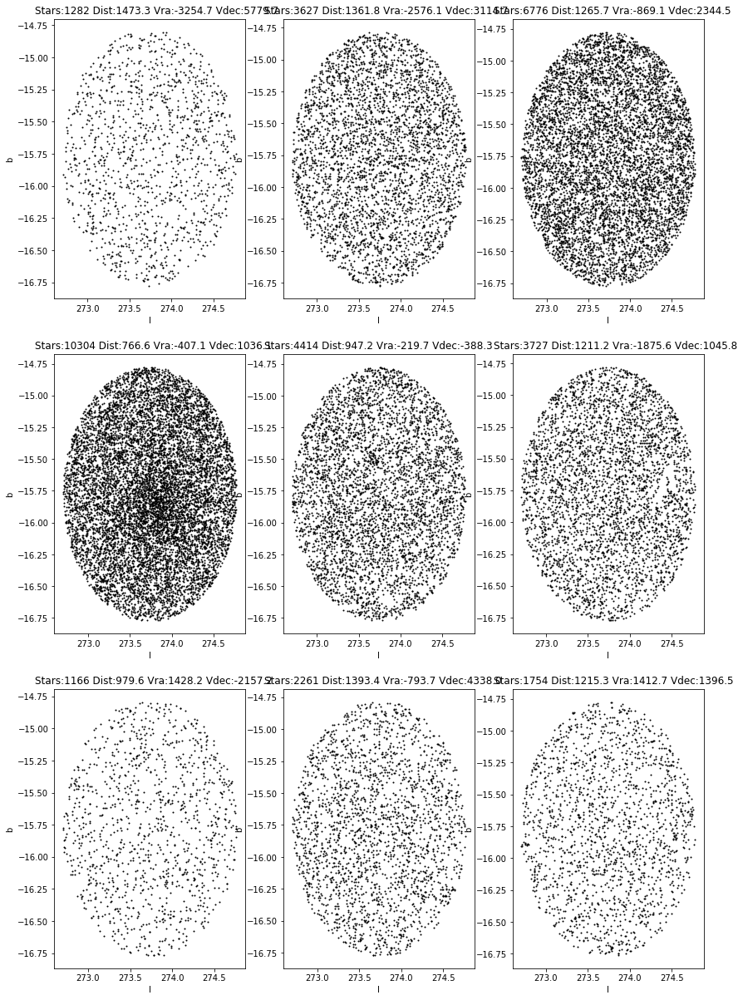

20200
## std: 0.281443


/home/stephane/.local/lib/python3.6/site-packages/numpy/core/_methods.py:135: RuntimeWarning: Degrees of freedom <= 0 for slice
  keepdims=keepdims)
/home/stephane/.local/lib/python3.6/site-packages/numpy/core/_methods.py:105: RuntimeWarning: invalid value encountered in true_divide
  arrmean, rcount, out=arrmean, casting='unsafe', subok=False)
/home/stephane/.local/lib/python3.6/site-packages/numpy/core/_methods.py:127: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


23125
## std: 0.414056
23650
## std: 0.484224
20900
## std: 0.301208
23425
## std: 0.442202
23600
## std: 0.423946
23500
## std: 0.499995
22625
## std: 0.356866
22075
## std: 0.328061


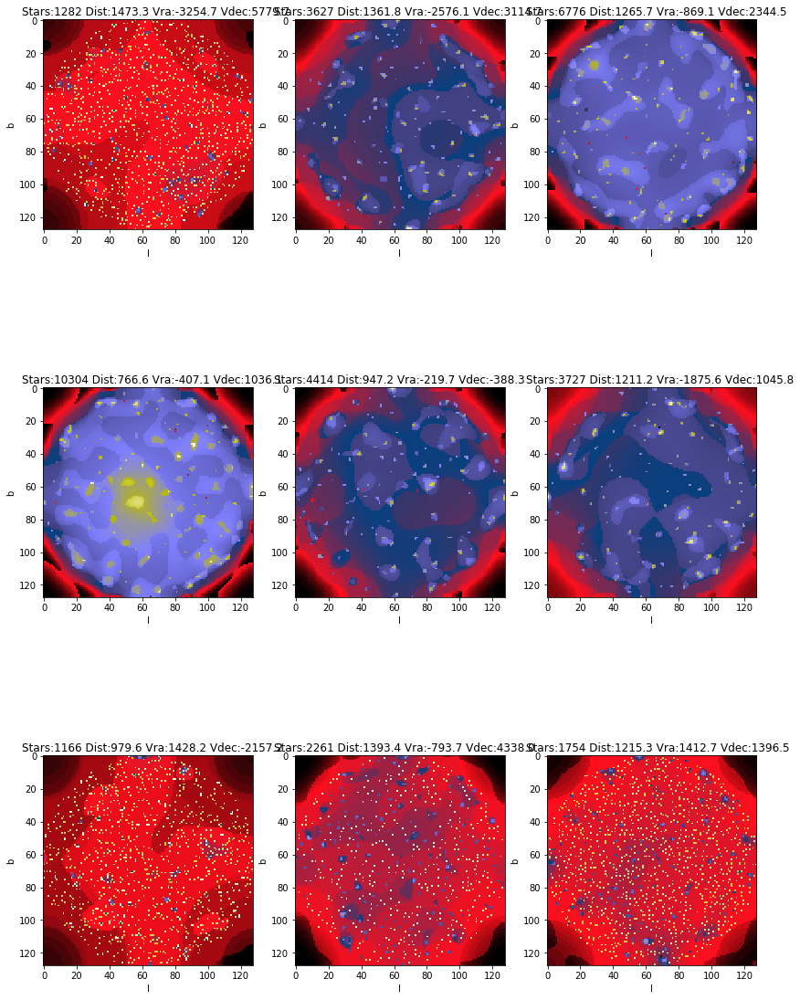

Cluster: ESO 123-26
Distance: 816.0 pc


## Total stars: 81360
## Stars selected: 32878
## computing k-means...
## Centroids:
[[  273.02689157   -16.20947826  1249.13266389  -785.72342226
   2342.77951587]
 [  273.04655494   -16.1703301   1188.77023871 -1850.9444735
   1036.45771617]
 [  273.10679875   -16.15692416   792.35101803  -385.09643094
    956.68014295]
 [  273.05062934   -16.18474866  1364.87792506 -2437.00868815
   3188.1510322 ]
 [  273.03401474   -16.2233688   1451.67521454 -3129.02161146
   5842.03736732]
 [  273.02650587   -16.19781005   949.73835784  -239.17889206
   -657.26661779]
 [  273.03433184   -16.21859497  1195.81332794  1308.33337598
   1198.99087461]
 [  273.02441095   -16.22716241  1383.8369082   -571.27071298
   4523.07916968]
 [  273.04569036   -16.2243993   1009.7961514   1938.40428766
  -2265.76787177]]
## Label: 0, 6624 stars
## Label: 1, 3571 stars
## Label: 2, 9237 stars
## Label: 3, 3713 stars
## Label: 4, 1214 stars
## Label: 5, 3787 stars
## Label: 6, 1947 stars
## Label: 7, 1942 stars
## 

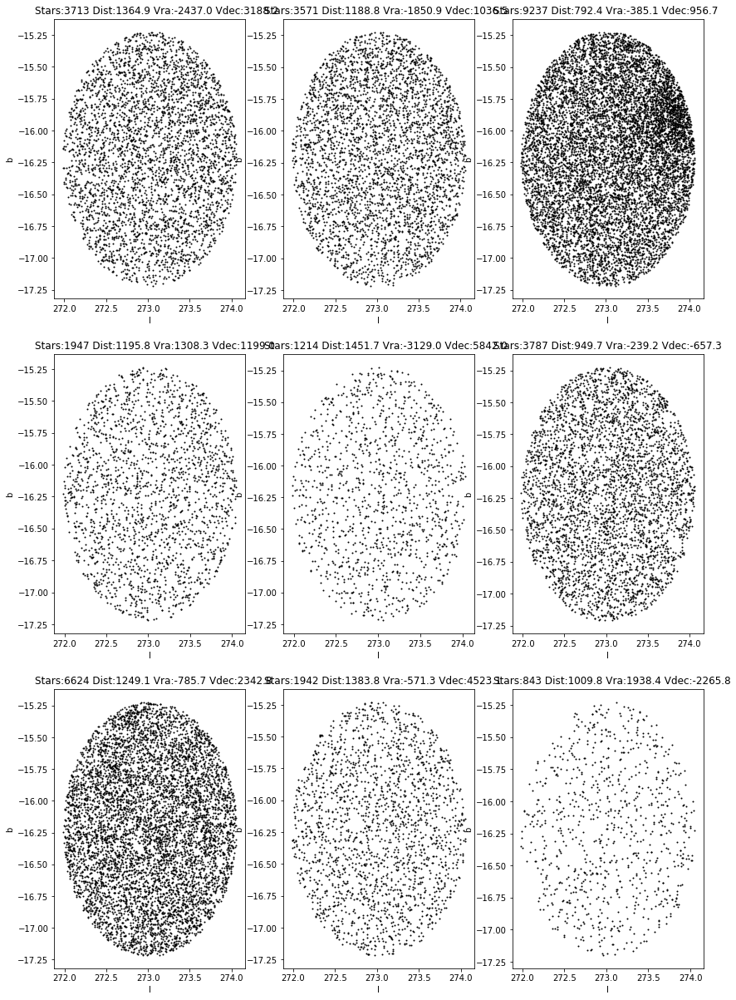

23650
## std: 0.484827
23725
## std: 0.419042
23550
## std: 0.497449
23850
## std: 0.416131
20700
## std: 0.295964
23675
## std: 0.421178
22850
## std: 0.341314
22550
## std: 0.341000
18375
## std: 0.253835


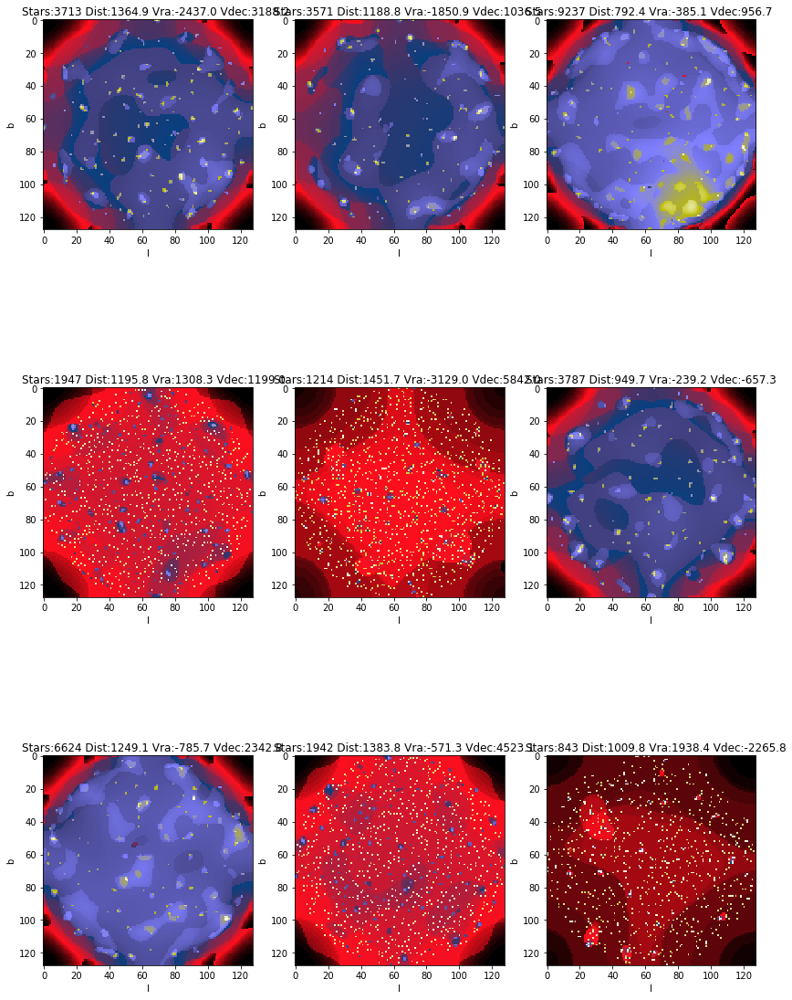

Cluster: MWSC 4116
Distance: 1743.0 pc


## Total stars: 34526
## Stars selected: 15968
## computing k-means...
## Centroids:
[[  268.9557167    -27.17997022  1191.9329903   2635.42543804
    764.26193931]
 [  268.99497697   -27.11836275  1202.21729055  -864.41586658
   3586.51891485]
 [  268.95225551   -27.14763088   901.45773574   236.70234654
  -1807.67929106]
 [  268.97648244   -27.17634366  1379.11804395  -162.04425213
   6291.24233404]
 [  268.92311846   -27.21051161  1177.30407548  3723.81364094
  -4164.067791  ]
 [  268.96556842   -27.14872598  1260.62828055  1659.23305077
   4038.95886691]
 [  268.9607583    -27.13704294  1046.46114077   361.19106326
   2043.23364199]
 [  268.96741385   -27.12349721   964.31937104 -1155.6125913
   1055.35729537]
 [  268.98427466   -27.14142204   861.13840084   286.17548821
    259.04332512]]
## Label: 0, 897 stars
## Label: 1, 2157 stars
## Label: 2, 1428 stars
## Label: 3, 843 stars
## Label: 4, 201 stars
## Label: 5, 1197 stars
## Label: 6, 3493 stars
## Label: 7, 2136 stars
## Lab

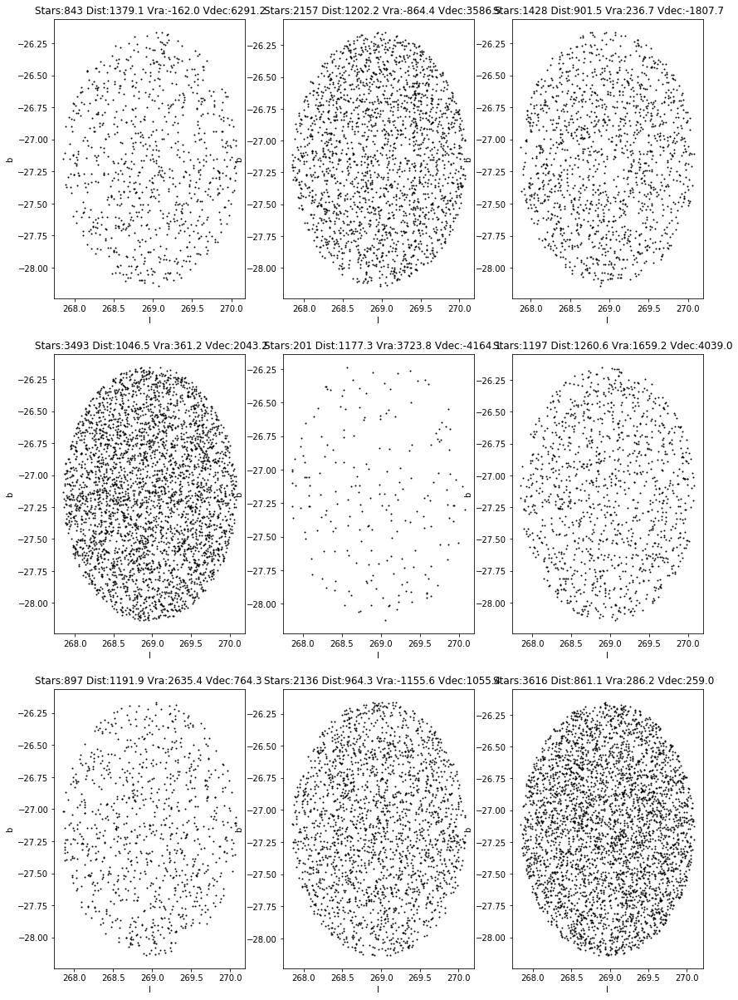

18625
## std: 0.269791
23075
## std: 0.352019
21225
## std: 0.298834
18350
## std: 0.270363
7250
## std: 0.209036
20525
## std: 0.291873
23525
## std: 0.411649
22975
## std: 0.349610
23375
## std: 0.418274


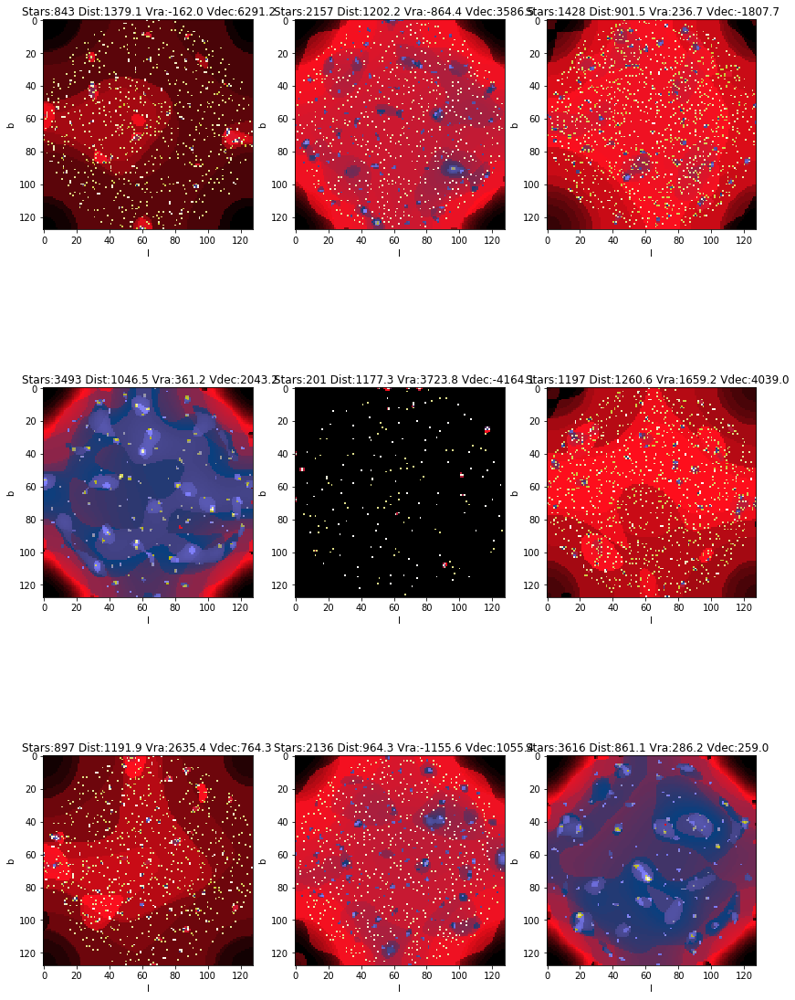

Cluster: NGC 2132
Distance: 1003.0 pc


## Total stars: 29868
## Stars selected: 13911
## computing k-means...
## Centroids:
[[  268.62205672   -30.07265502  1177.17152182 -1007.7571279
   3591.31037319]
 [  268.57174095   -30.10510613   892.8316864    165.03235395
  -1982.53465578]
 [  268.59978531   -30.12868329   842.20760974  -353.20463656
    131.48246711]
 [  268.60347978   -30.13496413  1322.01135319  4439.9149934
   3591.48675657]
 [  268.58246186   -30.08709969  1250.20877018  3629.89712711
  -3889.23171406]
 [  268.58289407   -30.09087185   941.61035853    13.31096853
   1707.51965732]
 [  268.6044117    -30.1167968   1152.8236166   1147.08525021
   3240.84766999]
 [  268.59448561   -30.13088907  1092.11031413  1566.19210326
    426.11821492]
 [  268.60802289   -30.08441123  1356.24436168   620.5291805
   6158.85182458]]
## Label: 0, 1438 stars
## Label: 1, 1182 stars
## Label: 2, 2686 stars
## Label: 3, 366 stars
## Label: 4, 242 stars
## Label: 5, 3237 stars
## Label: 6, 1923 stars
## Label: 7, 2075 stars
## Labe

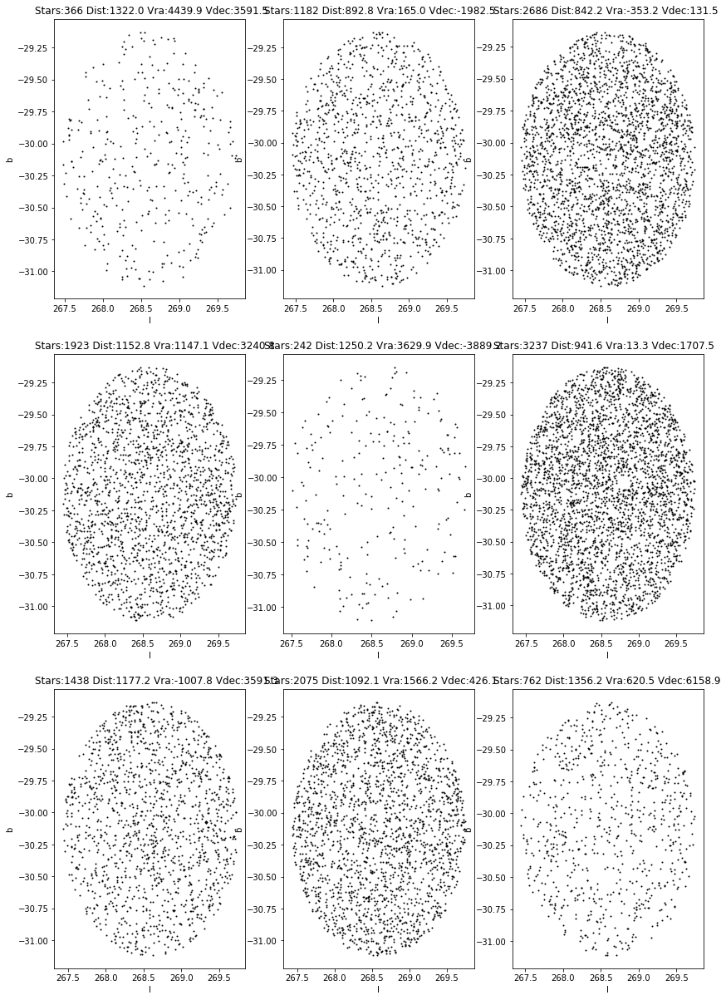

20975
## std: 0.304306
20650
## std: 0.290876
23200
## std: 0.380262
11350
## std: 0.221991
8325
## std: 0.220835
23250
## std: 0.404321
22175
## std: 0.341501
22450
## std: 0.348506
17225
## std: 0.258949


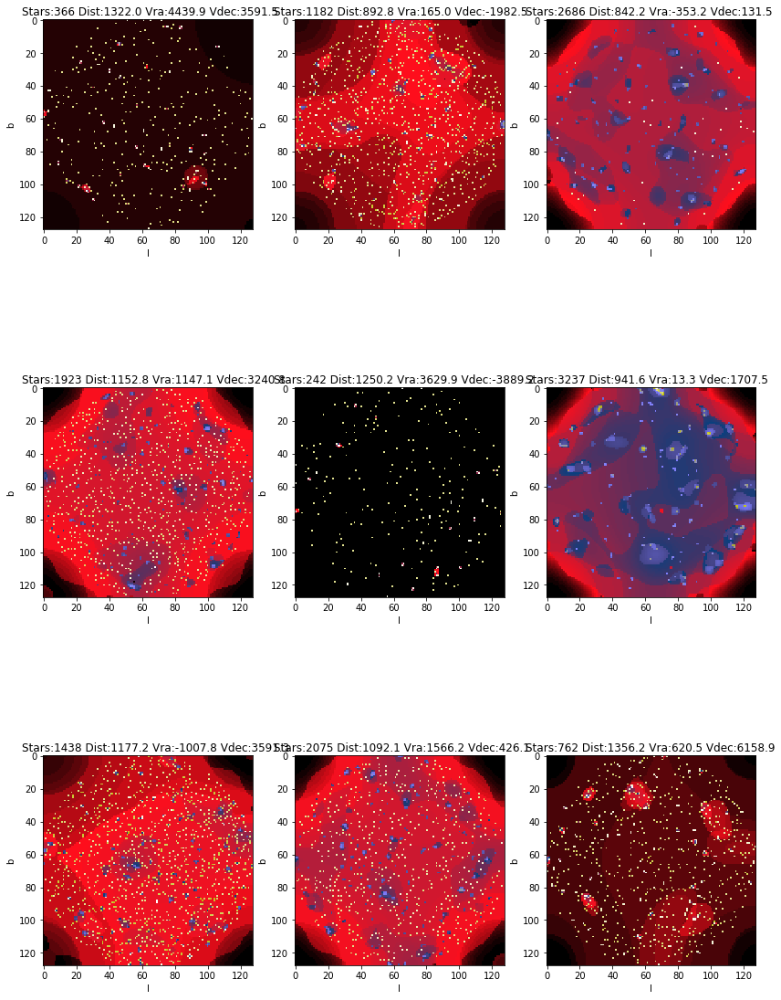

Cluster: FSR 1470
Distance: 1055.0 pc


## Total stars: 55554
## Stars selected: 23425
## computing k-means...
## Centroids:
[[  270.34933995   -19.12568672  1088.07530912 -1660.81614135
   1102.88648054]
 [  270.33915498   -19.14897438  1176.20702195  -478.53665248
   2309.09302887]
 [  270.32440304   -19.16912584   942.3849486   -155.80550712
   -977.13624154]
 [  270.33098594   -19.13255617  1439.71689654 -2575.04695099
   6175.81630813]
 [  270.31543832   -19.14530005   883.64599224  -123.02085085
    734.77627327]
 [  270.33399331   -19.12627515  1324.9104972  -1975.88332448
   3407.22287147]
 [  270.3275648    -19.18969384  1331.78862579    67.1366549
   4583.43476258]
 [  270.34999788   -19.17031063  1244.5007892   1754.24532946
   1608.95986245]
 [  270.35951704   -19.17327157  1054.45292079  1996.38453206
  -2164.75813989]]
## Label: 0, 2901 stars
## Label: 1, 5031 stars
## Label: 2, 2448 stars
## Label: 3, 867 stars
## Label: 4, 5757 stars
## Label: 5, 2920 stars
## Label: 6, 1492 stars
## Label: 7, 1245 stars
## L

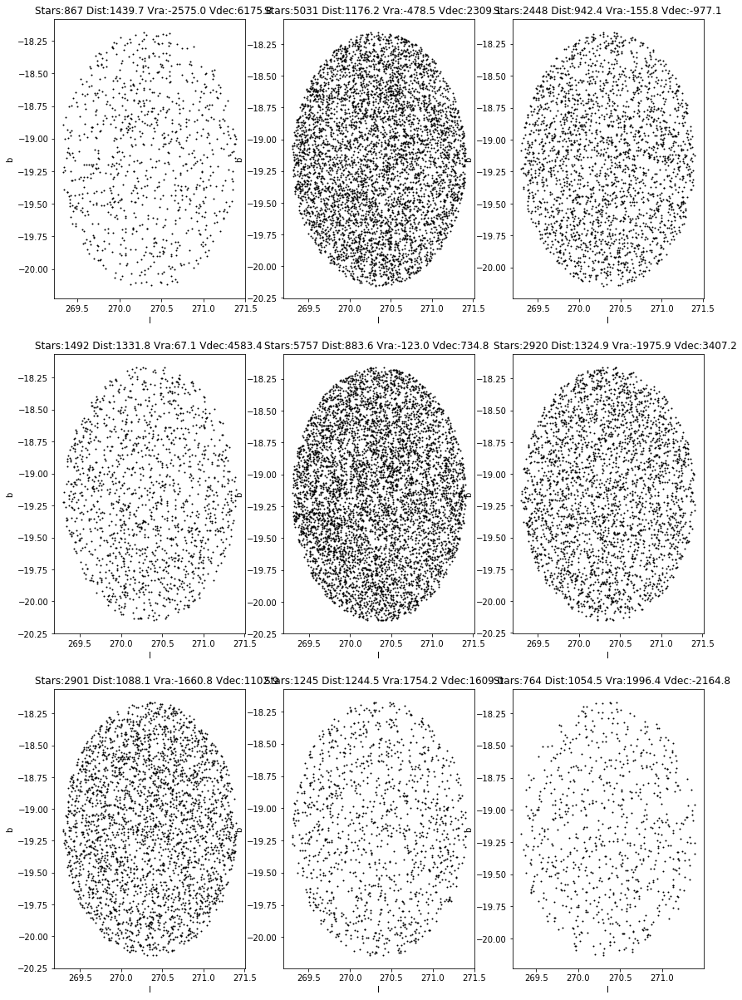

23200
## std: 0.388298
23550
## std: 0.456000
23025
## std: 0.366848
18050
## std: 0.270864
23675
## std: 0.469137
23225
## std: 0.388276
22025
## std: 0.309478
19975
## std: 0.293310
17900
## std: 0.256554


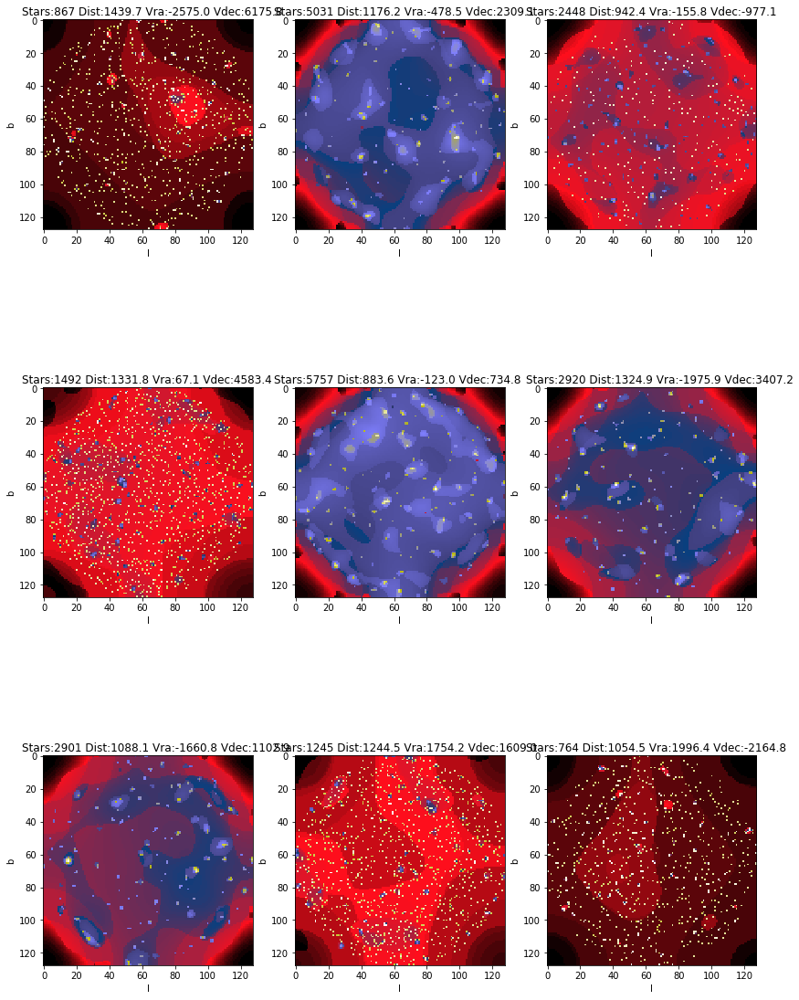

Cluster: FSR 1470
Distance: 1055.0 pc
## Total stars: 55554
## Stars selected: 23425
## computing k-means...
## Centroids:
[[  270.3386618    -19.14866475  1175.79206739  -477.9680469
   2306.27350404]
 [  270.31515873   -19.1457339    882.36466918  -121.59779313
    732.2197421 ]
 [  270.32974753   -19.13194191  1441.16809556 -2569.34035198
   6165.51933081]
 [  270.33535083   -19.12654881  1324.15161599 -1974.75723475
   3402.55506802]
 [  270.34910487   -19.12541452  1087.91410483 -1659.50810694
   1099.8025367 ]
 [  270.34957646   -19.17040949  1244.38651046  1755.1291889
   1608.6233622 ]
 [  270.35860144   -19.17236086  1055.21546632  2000.88924032
  -2163.19745739]
 [  270.32818933   -19.18933476  1332.52903376    69.41936335
   4580.24840464]
 [  270.32525357   -19.16959486   943.89221774  -155.23329044
   -982.45534933]]
## Label: 0, 5032 stars
## Label: 1, 5755 stars
## Label: 2, 871 stars
## Label: 3, 2924 stars
## Label: 4, 2905 stars
## Label: 5, 1244 stars
## Label: 6, 76

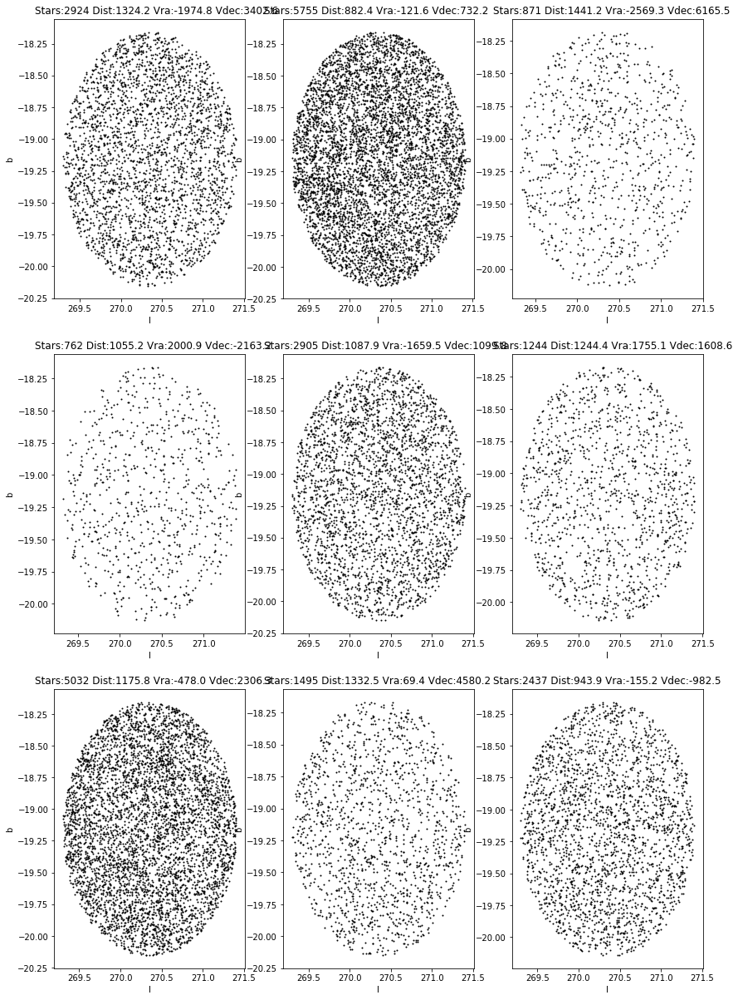

23850
## std: 0.454120
23950
## std: 0.470371
18075
## std: 0.267137
23450
## std: 0.386619
23300
## std: 0.390527
20800
## std: 0.292550
16875
## std: 0.253316
21900
## std: 0.311805
22900
## std: 0.366403


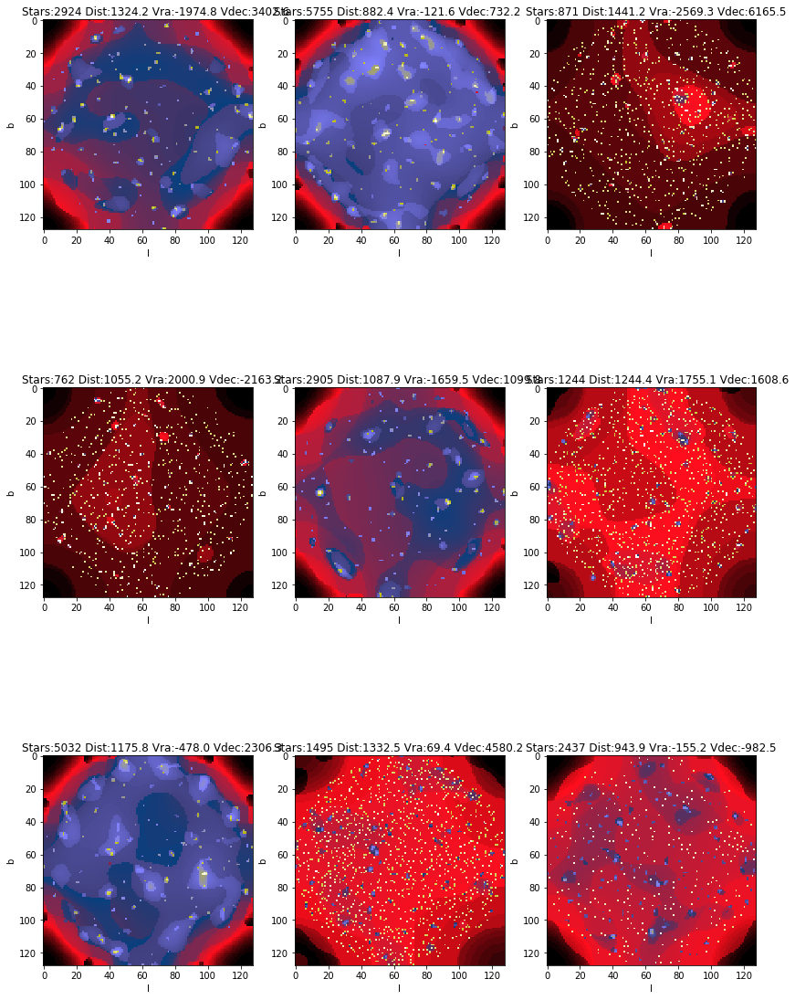

Cluster: FSR 1440
Distance: 1631.0 pc


## Total stars: 68192
## Stars selected: 26997
## computing k-means...
## Centroids:
[[  265.28008928   -17.06711284  1207.79526478  -528.8151727
   2059.71985996]
 [  265.25094219   -17.0699567    959.05494771  -145.55416923
   -973.37867012]
 [  265.2786319    -17.03155631  1181.23349609 -1804.67147397
    930.97223661]
 [  265.27948052   -17.0567658    901.09116373  -255.29337807
    649.08639142]
 [  265.28487723   -17.04187912  1335.4901905  -1941.93935421
   3221.91031969]
 [  265.27204474   -17.06540336  1045.94426952  2058.31802716
  -2611.74001016]
 [  265.3179676    -17.07981098  1443.56432524 -2198.61694982
   5937.60028087]
 [  265.26657279   -17.09296513  1345.76169993    29.61008237
   4022.71834647]
 [  265.27386644   -17.09945476  1195.61326114  1456.63611895
   1147.54217094]]
## Label: 0, 6122 stars
## Label: 1, 2930 stars
## Label: 2, 2593 stars
## Label: 3, 6867 stars
## Label: 4, 3103 stars
## Label: 5, 715 stars
## Label: 6, 1001 stars
## Label: 7, 1940 stars
## L

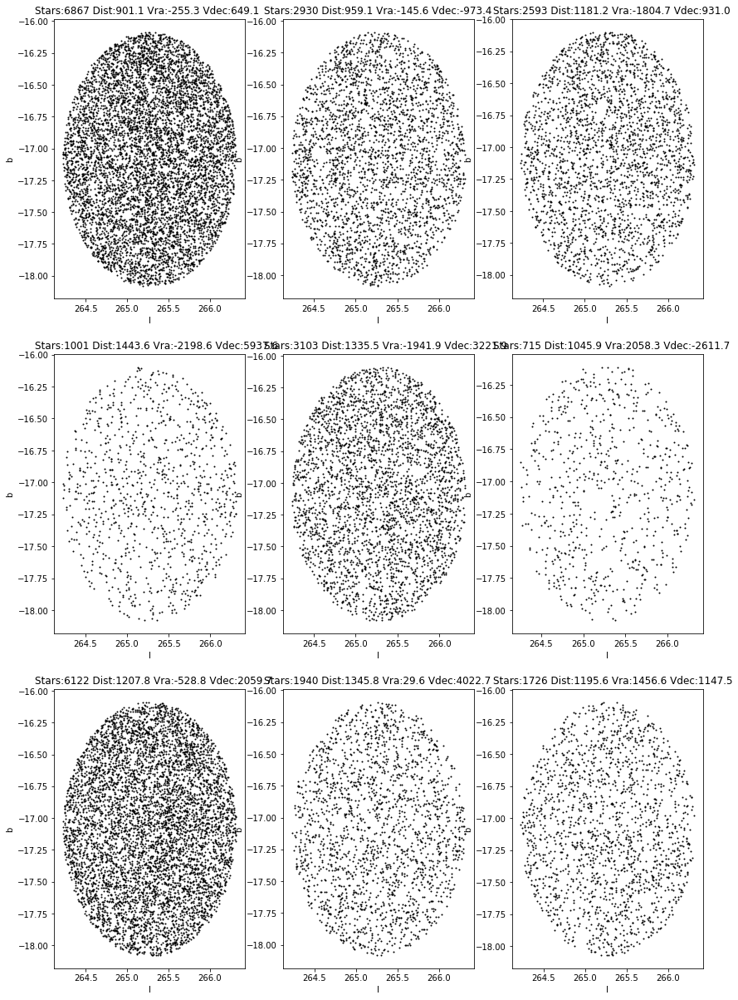

23675
## std: 0.476351
23300
## std: 0.391655
23300
## std: 0.372665
23700
## std: 0.485749
23250
## std: 0.397034
17650
## std: 0.247597
20025
## std: 0.277005
22625
## std: 0.339664
22300
## std: 0.331758


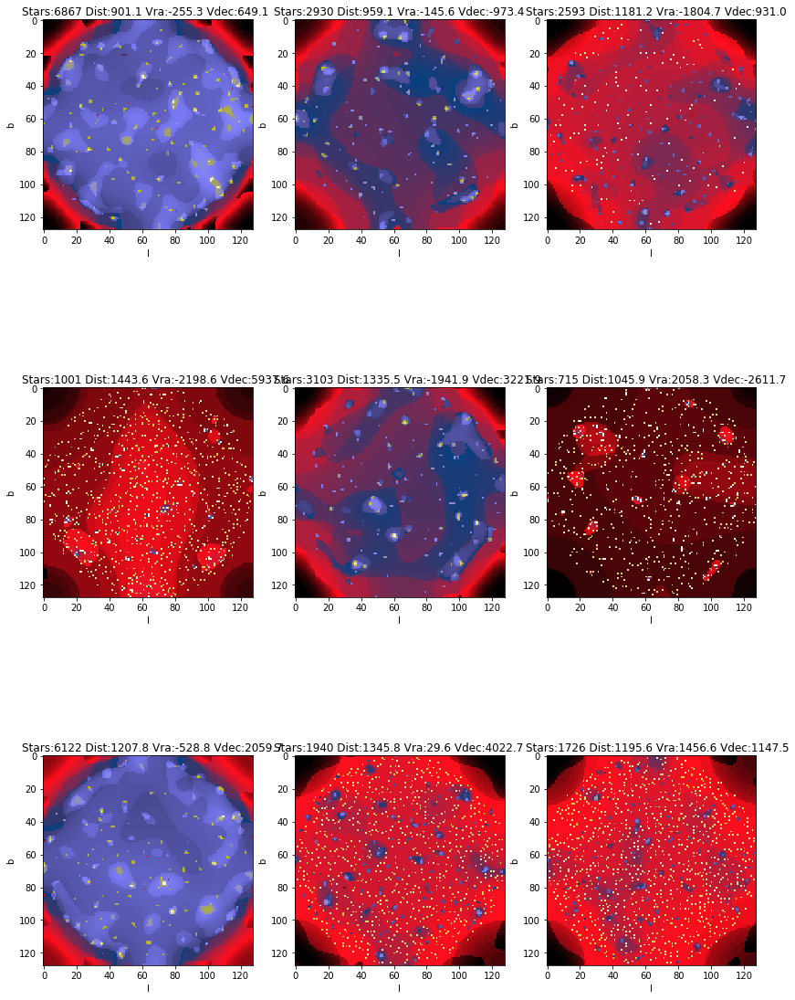

Cluster: ASCC 42
Distance: 792.0 pc


## Total stars: 107724
## Stars selected: 37320
## computing k-means...
## Centroids:
[[  266.3037264    -12.75728942   870.68701816  -328.89062059
    757.44547034]
 [  266.33437985   -12.79011847  1461.45778024 -2833.84127857
   5249.3554003 ]
 [  266.32161577   -12.76089224  1276.82853905  -835.49518476
   1891.93334543]
 [  266.3059468    -12.77369018   947.13255871   -73.46442154
   -666.30923845]
 [  266.30346085   -12.81442123  1391.67924961  -773.57785794
   3671.03789256]
 [  266.31781462   -12.74225763  1368.24209315 -2383.24158305
   2686.31165972]
 [  266.29458502   -12.79024772  1047.0006078   1667.60550304
  -2488.64894544]
 [  266.33089599   -12.75959913  1197.00007499 -1684.32098976
    539.25767304]
 [  266.31876286   -12.80365617  1253.42194462  1258.75056169
   1375.51486802]]
## Label: 0, 9460 stars
## Label: 1, 1600 stars
## Label: 2, 8853 stars
## Label: 3, 3844 stars
## Label: 4, 3270 stars
## Label: 5, 3963 stars
## Label: 6, 866 stars
## Label: 7, 3684 stars
##

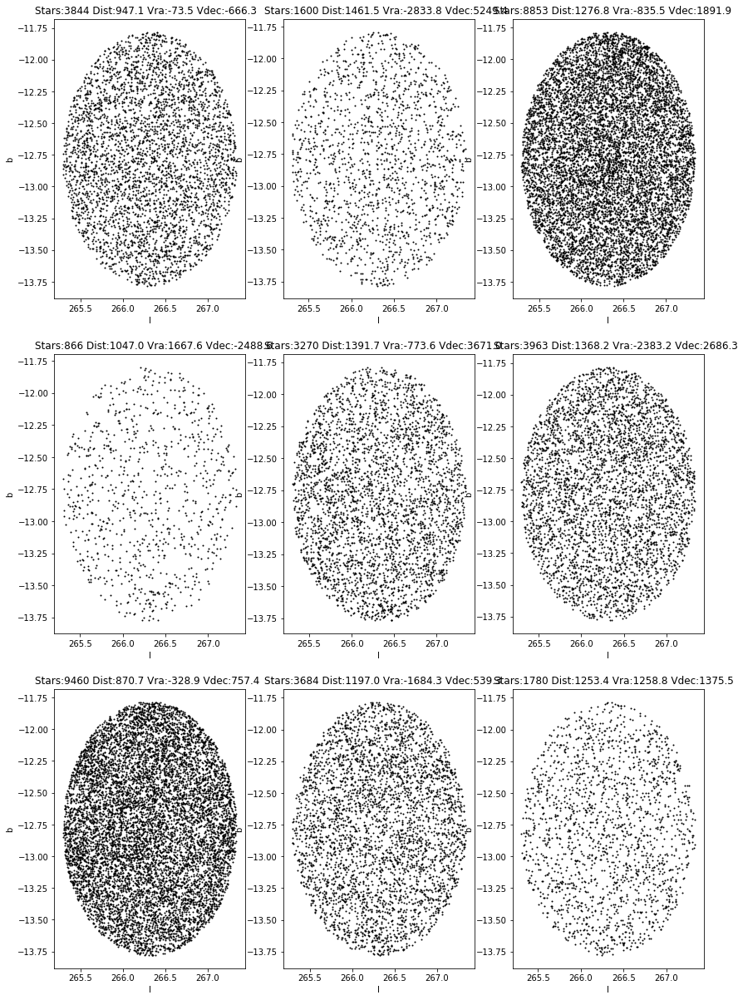

23875
## std: 0.499006
21100
## std: 0.320248
23775
## std: 0.497375
23600
## std: 0.423495
23175
## std: 0.403453
23525
## std: 0.430875
17700
## std: 0.270504
23550
## std: 0.416353
22000
## std: 0.335803


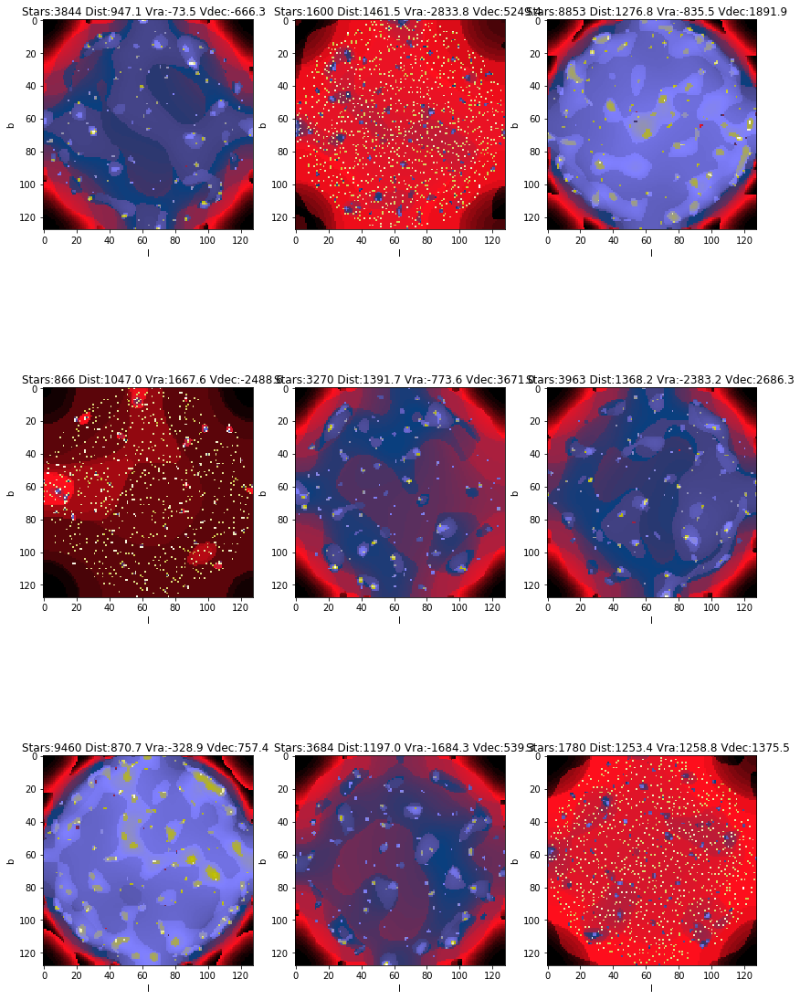

Cluster: MWSC 5670
Distance: 1682.0 pc


## Total stars: 56415
## Stars selected: 23735
## computing k-means...
## Centroids:
[[  261.41132105   -18.92073424  1295.86303993 -1367.80293731
   3153.20611957]
 [  261.40341075   -18.93373102   874.47519787   -90.89459947
    460.66339029]
 [  261.40511311   -18.9886004   1325.80507239   580.11060346
   4199.45251691]
 [  261.42546173   -18.90971535  1398.09496907 -1902.47788618
   5556.3888989 ]
 [  261.42033921   -18.96577092  1069.81608395  2401.69476368
  -3461.33090564]
 [  261.38005915   -18.93961797  1203.80363679  1857.35263352
    675.3371914 ]
 [  261.42108436   -18.9364776    967.20769443   -72.95937448
  -1326.38721661]
 [  261.43532046   -18.92649384  1112.75397712 -1546.23099288
   1081.61473098]
 [  261.40134329   -18.93889654  1157.29945796   -99.22998689
   1921.26025782]]
## Label: 0, 3004 stars
## Label: 1, 5978 stars
## Label: 2, 1426 stars
## Label: 3, 1093 stars
## Label: 4, 443 stars
## Label: 5, 1428 stars
## Label: 6, 2320 stars
## Label: 7, 2742 stars
## 

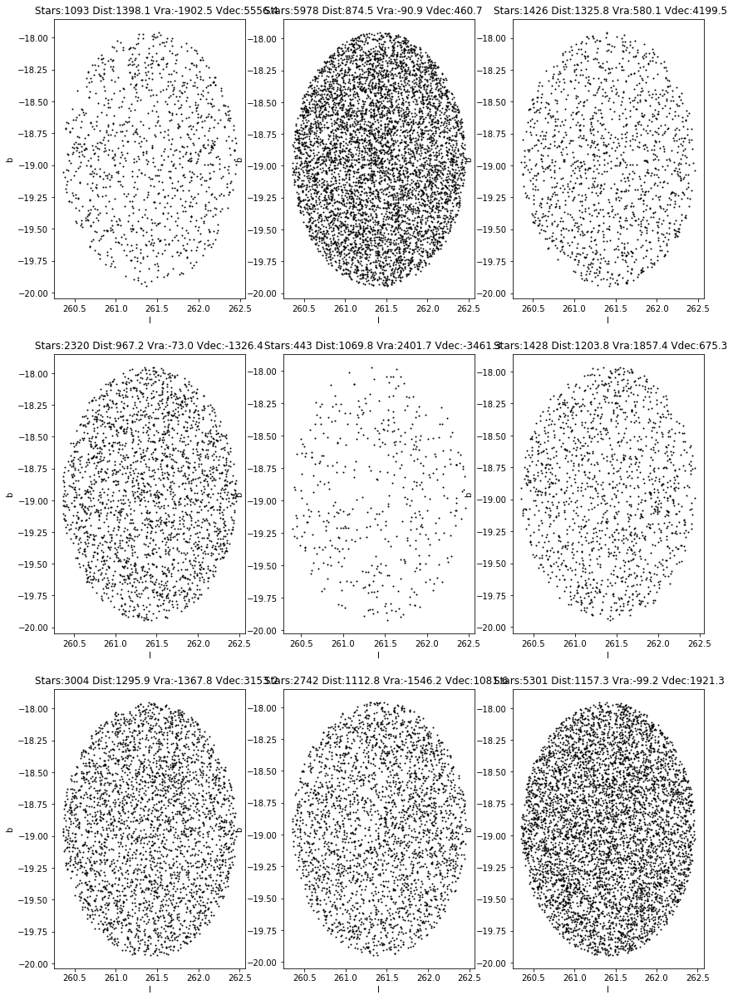

23700
## std: 0.390152
23800
## std: 0.472618
21175
## std: 0.306348
19425
## std: 0.283788
12825
## std: 0.227923
21225
## std: 0.310124
22975
## std: 0.362190
22850
## std: 0.382391
23825
## std: 0.463422


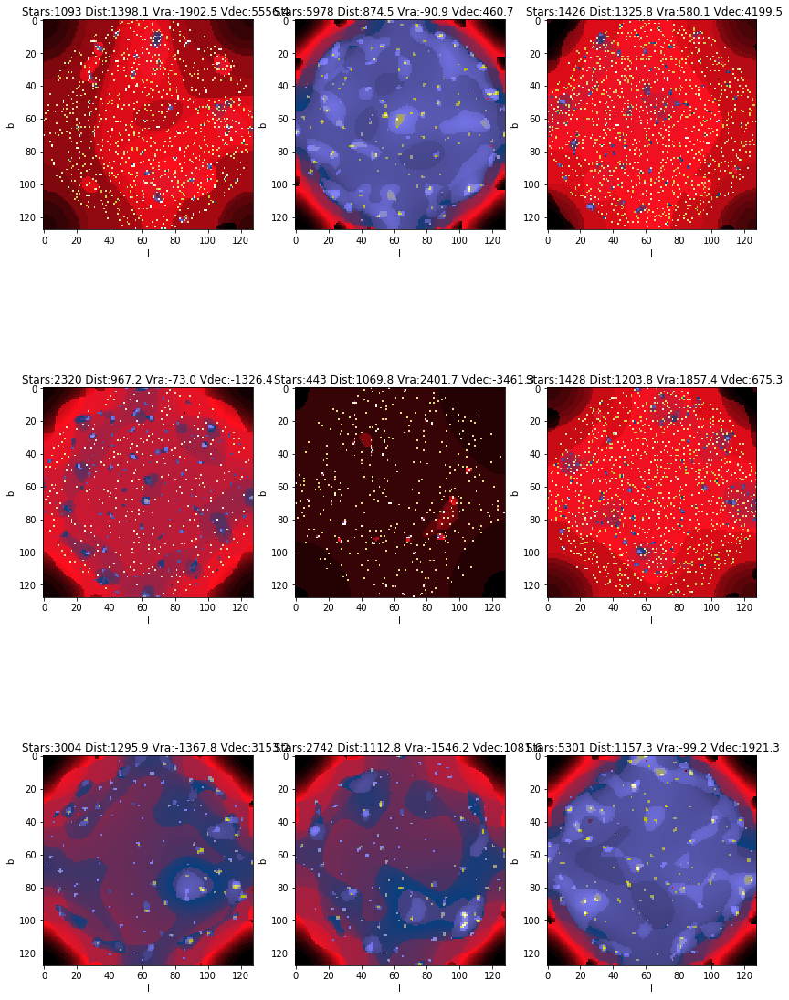

Cluster: MWSC 5670
Distance: 1682.0 pc
## Total stars: 56415
## Stars selected: 23735
## computing k-means...
## Centroids:
[[  261.41155058   -18.92132096  1298.11766218 -1402.45886755
   3168.555674  ]
 [  261.40342098   -18.93338939   878.00358506   -77.09135095
    485.88202231]
 [  261.40073475   -18.9396634   1162.16314506   -90.47811798
   1965.79002771]
 [  261.40813489   -18.9876408   1327.01717556   567.73040675
   4226.07686869]
 [  261.42178554   -18.93515255   962.89872145  -109.29460842
  -1289.6986375 ]
 [  261.37673638   -18.94173305  1204.33880669  1869.21438575
    665.75123575]
 [  261.40967666   -18.97343218  1078.10704897  2316.69968353
  -3408.75312551]
 [  261.4351768    -18.92500904  1112.0709202  -1499.59946521
   1097.95770493]
 [  261.4271655    -18.9085492   1399.74696052 -1901.14118387
   5582.56152444]]
## Label: 0, 2948 stars
## Label: 1, 6035 stars
## Label: 2, 5167 stars
## Label: 3, 1407 stars
## Label: 4, 2357 stars
## Label: 5, 1412 stars
## Label: 6

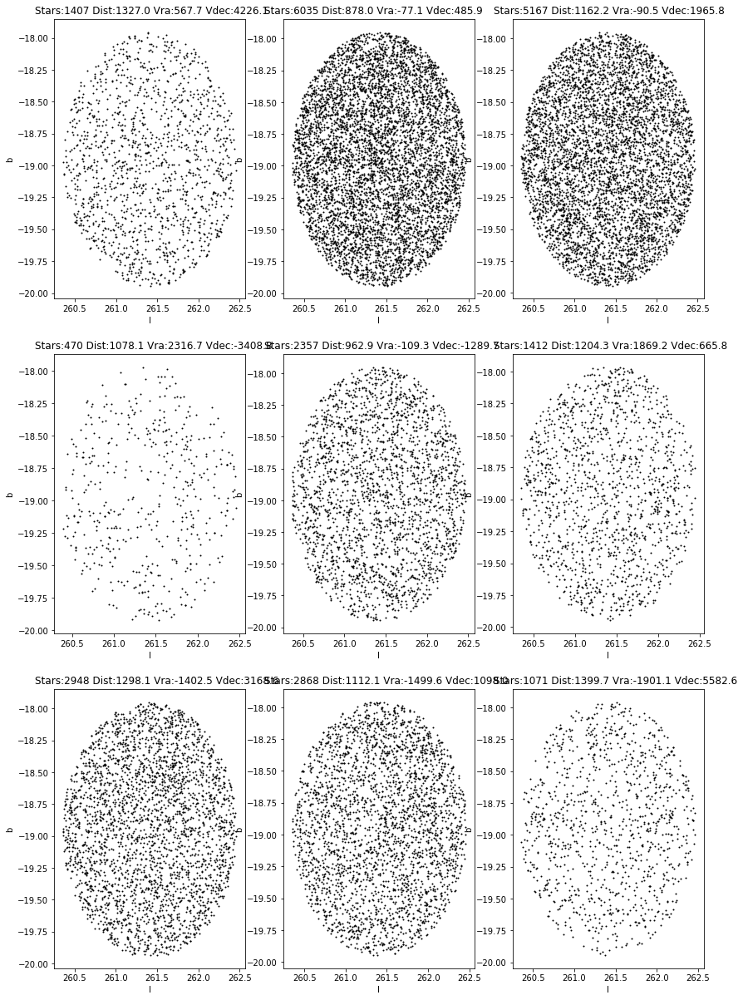

23425
## std: 0.389518
23400
## std: 0.474040
23450
## std: 0.459292
21075
## std: 0.303666
22925
## std: 0.365143
20800
## std: 0.309626
12625
## std: 0.234603
22925
## std: 0.390855
20075
## std: 0.283179


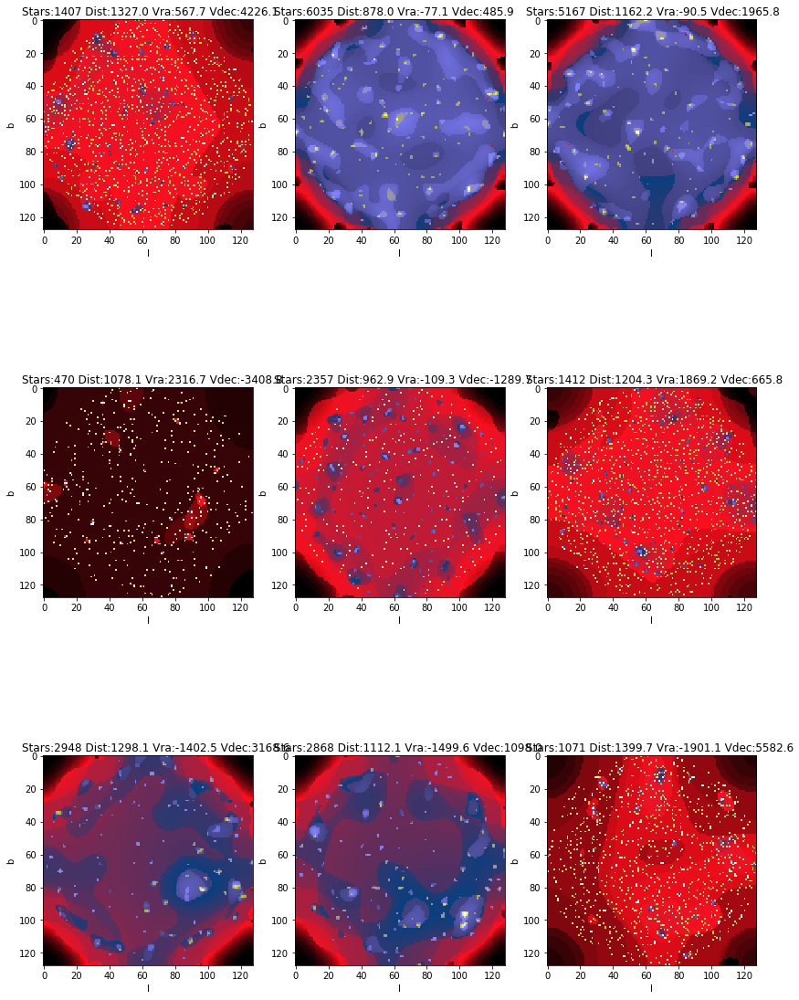

Cluster: ASCC 44
Distance: 553.0 pc


## Total stars: 154542
## Stars selected: 47274
## computing k-means...
## Centroids:
[[  264.87295864   -10.27919781  1227.06466631 -1795.36890847
    271.10794721]
 [  264.8707751    -10.31146869   819.50754872   -99.35017212
    -68.9623633 ]
 [  264.88766587   -10.27865348  1402.89491334 -2585.99472352
   2556.82127198]
 [  264.88348486   -10.28633525   981.24348765  -526.9909404
    905.19061348]
 [  264.88654134   -10.29028287  1369.6138541  -1033.61015048
   1879.76190584]
 [  264.85804885   -10.3150008   1045.49449551  1035.73600714
  -2045.56773771]
 [  264.88444009   -10.31743727  1477.18745152 -3050.21818625
   5095.47819513]
 [  264.8607113    -10.33573887  1282.73257474   776.43760054
   1550.43353638]
 [  264.87411541   -10.32745714  1430.43710304 -1055.5631471
   3527.61584274]]
## Label: 0, 3621 stars
## Label: 1, 7385 stars
## Label: 2, 3850 stars
## Label: 3, 12295 stars
## Label: 4, 10272 stars
## Label: 5, 1718 stars
## Label: 6, 1646 stars
## Label: 7, 2634 stars
#

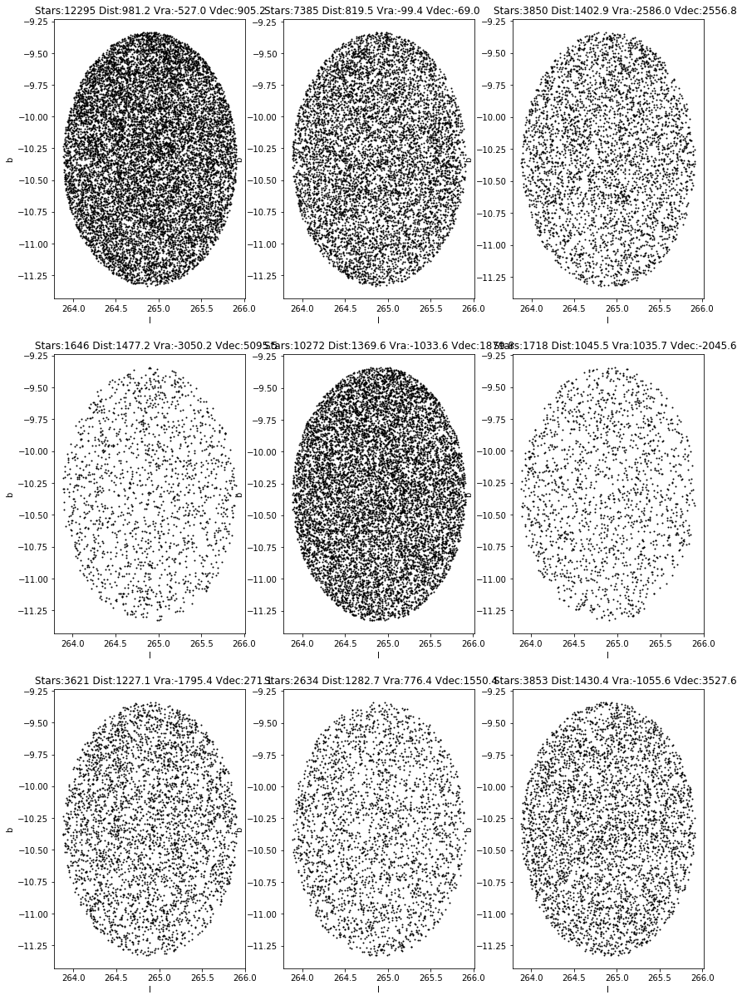

23800
## std: 0.417693
23825
## std: 0.491093
23675
## std: 0.425400
23475
## std: 0.495947
23875
## std: 0.499853
21825
## std: 0.327833
22275
## std: 0.323750
22500
## std: 0.380517
23500
## std: 0.426746


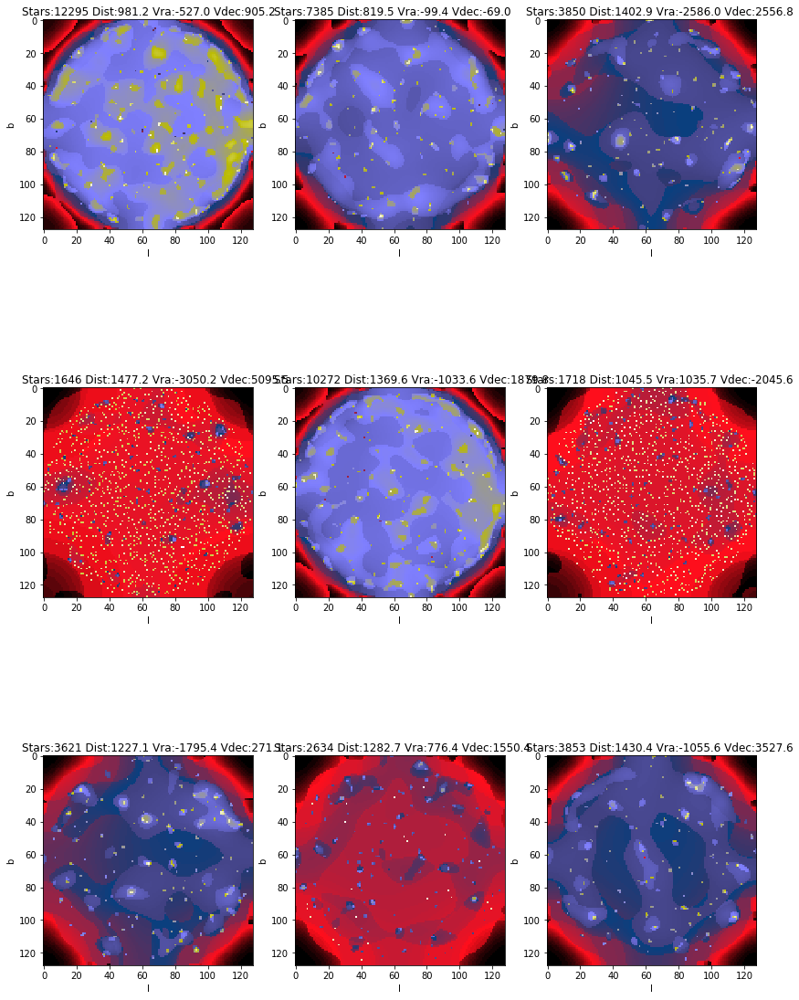

Cluster: MWSC 4545
Distance: 1070.0 pc


## Total stars: 51564
## Stars selected: 20852
## computing k-means...
## Centroids:
[[  349.22582346   -32.46131853   873.51992082   104.07328364
  -1344.61488666]
 [  349.22041733   -32.48051027  1353.63372168 -4181.23895487
  -4392.8903752 ]
 [  349.24135721   -32.46957347  1122.68400866  1579.21396401
  -2871.99997763]
 [  349.25051381   -32.48277392  1035.00805254  2093.55184347
   -755.85202696]
 [  349.24326892   -32.45143064   776.05159269   -65.13071098
    180.28244965]
 [  349.25143223   -32.47375535  1129.63143735 -1983.03954021
   -776.78501376]
 [  349.23556011   -32.44922782  1223.32008533  -726.53526766
  -3200.96666437]
 [  349.27767608   -32.47366595  1365.21687429   671.01774035
  -6197.12074487]
 [  349.23531478   -32.48037007  1322.39465046  4162.60714848
  -4207.47256426]]
## Label: 0, 5160 stars
## Label: 1, 487 stars
## Label: 2, 2770 stars
## Label: 3, 2462 stars
## Label: 4, 4021 stars
## Label: 5, 2014 stars
## Label: 6, 2217 stars
## Label: 7, 790 stars
## L

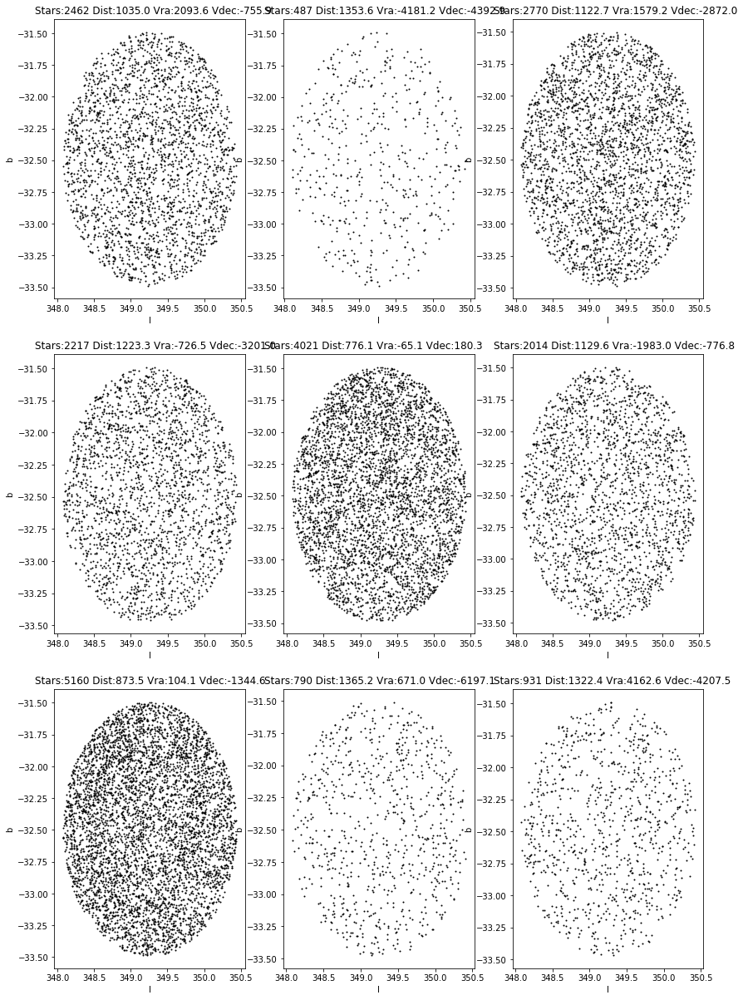

23450
## std: 0.456373
14050
## std: 0.235498
23550
## std: 0.379958
23025
## std: 0.367450
23175
## std: 0.430295
22700
## std: 0.343386
23050
## std: 0.354350
17975
## std: 0.264722
18250
## std: 0.274323


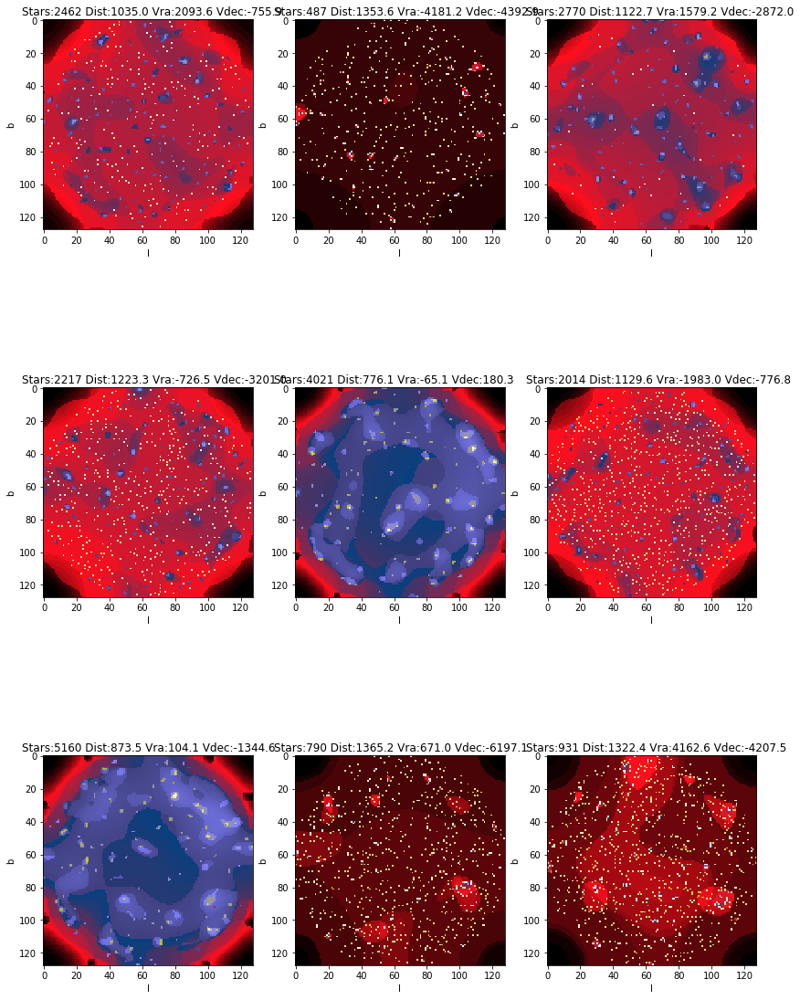

Cluster: NGC 3909
Distance: 1792.0 pc


## Total stars: 147021
## Stars selected: 48920
## computing k-means...
## Centroids:
[[ 2.92542139e+02  1.34923938e+01  1.29939481e+03 -3.05597711e+03
   4.84329993e+00]
 [ 2.92552442e+02  1.35023893e+01  7.34663997e+02 -3.44819158e+02
   1.14918215e+02]
 [ 2.92528607e+02  1.35279861e+01  1.23101999e+03 -1.95220205e+03
  -2.10330294e+03]
 [ 2.92546899e+02  1.35203937e+01  1.05515857e+03  1.21249492e+03
  -1.39913536e+03]
 [ 2.92546188e+02  1.35054975e+01  1.48519437e+03 -6.92307103e+03
   1.50073188e+03]
 [ 2.92536556e+02  1.35290077e+01  1.41914348e+03 -5.07441458e+03
  -9.00483290e+02]
 [ 2.92517970e+02  1.35032902e+01  1.40840673e+03 -4.20132391e+03
   1.46606146e+03]
 [ 2.92519497e+02  1.34888174e+01  1.26884904e+03 -2.09848064e+03
   1.20198518e+03]
 [ 2.92551735e+02  1.34965665e+01  1.03257562e+03 -1.51678917e+03
  -1.60691856e+00]]
## Label: 0, 7856 stars
## Label: 1, 10609 stars
## Label: 2, 2338 stars
## Label: 3, 2173 stars
## Label: 4, 1575 stars
## Label: 5, 2504 stars
## 

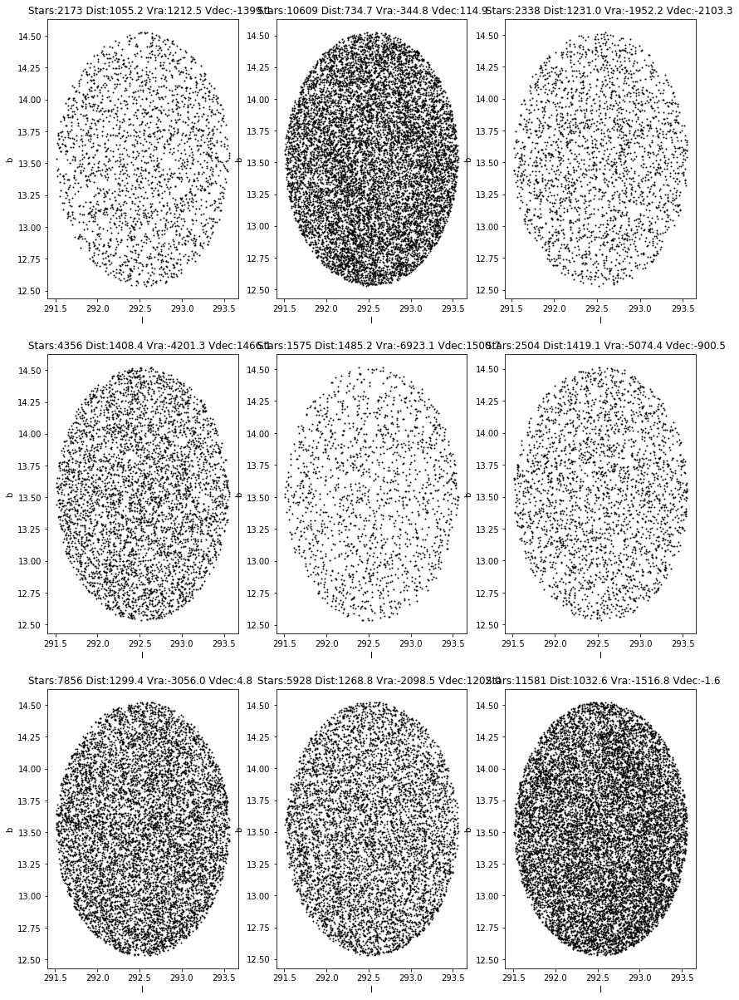

23850
## std: 0.494360
23775
## std: 0.499978
22900
## std: 0.358393
22750
## std: 0.350822
21725
## std: 0.319279
23325
## std: 0.368425
23575
## std: 0.444414
23625
## std: 0.470040
23700
## std: 0.498524


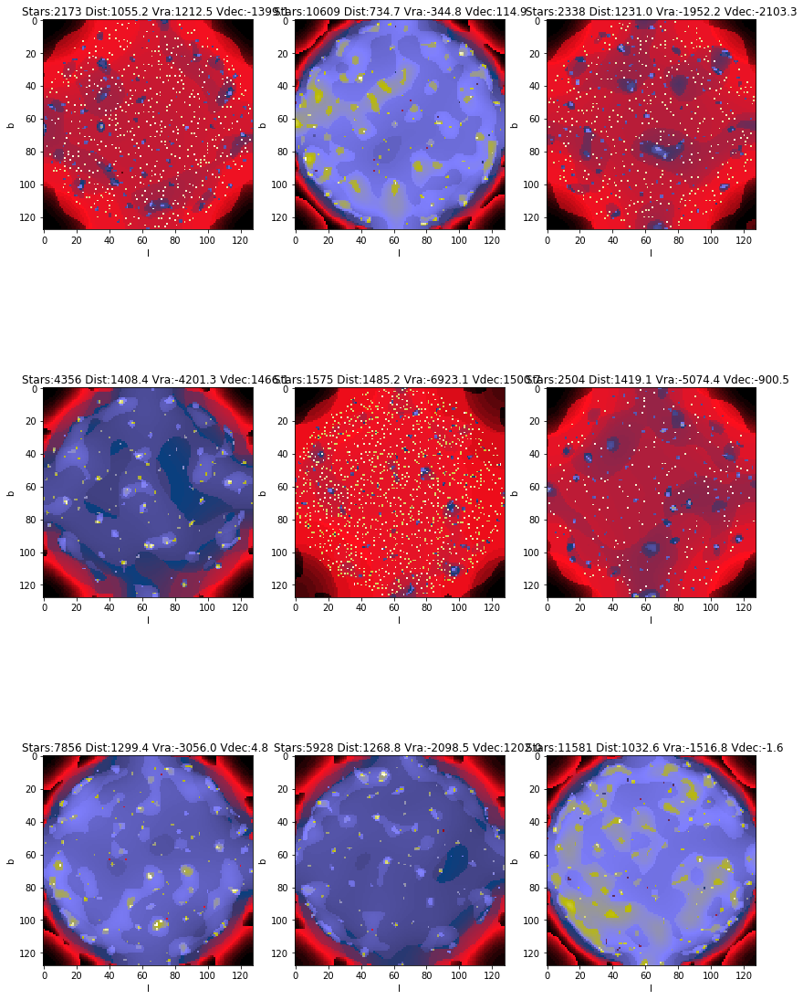

Cluster: FSR 1471
Distance: 1966.0 pc


## Total stars: 167630
## Stars selected: 59869
## computing k-means...
## Centroids:
[[ 2.70705340e+02  2.23427613e+00  1.44041927e+03 -2.59118599e+03
   2.69596350e+03]
 [ 2.70730503e+02  2.28998762e+00  9.93317666e+02 -1.05326116e+03
   7.80646097e+02]
 [ 2.70732588e+02  2.27447355e+00  1.37218440e+03 -2.05574023e+03
   1.34743779e+03]
 [ 2.70769368e+02  2.29544349e+00  1.39751252e+03 -3.83795116e+03
   1.59452573e+03]
 [ 2.70701616e+02  2.23365128e+00  1.44714364e+03 -4.63399056e+03
   4.18817473e+03]
 [ 2.70708665e+02  2.27232222e+00  1.26371213e+03 -9.55453620e+02
   1.87833534e+03]
 [ 2.70727798e+02  2.27754239e+00  1.15558207e+03 -1.82055700e+03
  -4.37179810e+02]
 [ 2.70730390e+02  2.27062267e+00  6.73683083e+02 -2.94952530e+02
   1.88072313e+02]
 [ 2.70687673e+02  2.24495144e+00  9.31675585e+02  8.83158209e+02
  -1.73021108e+03]]
## Label: 0, 5258 stars
## Label: 1, 15035 stars
## Label: 2, 11638 stars
## Label: 3, 2910 stars
## Label: 4, 1285 stars
## Label: 5, 5345 stars
##

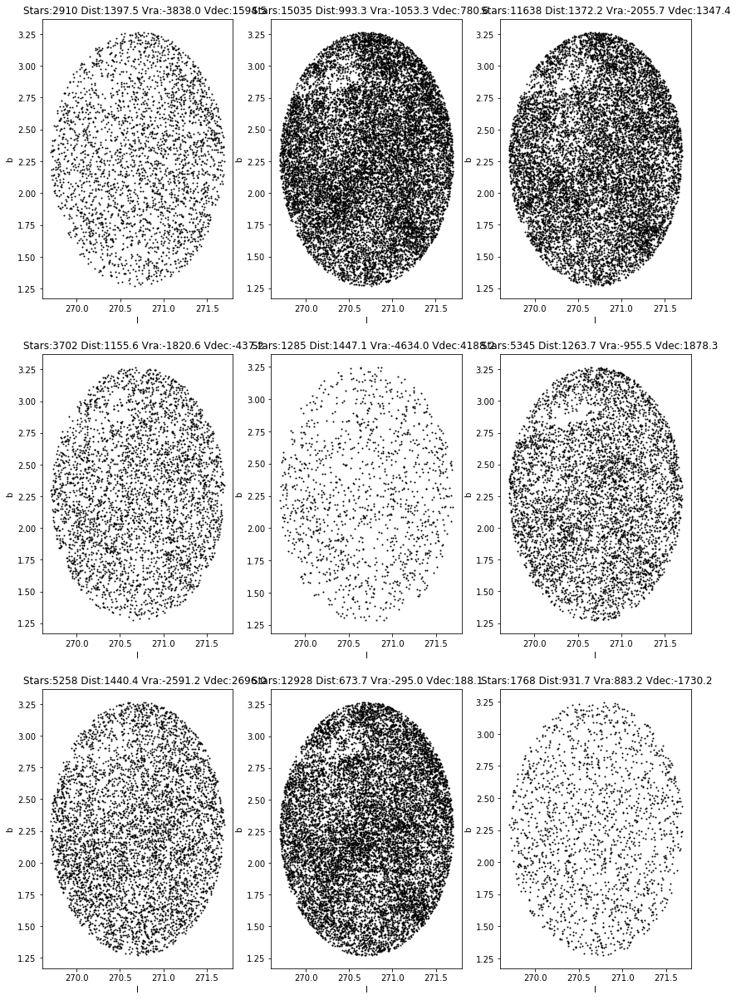

23475
## std: 0.461979
24000
## std: 0.485003
23675
## std: 0.498855
23375
## std: 0.391002
20625
## std: 0.296444
23350
## std: 0.462079
23450
## std: 0.422638
23475
## std: 0.497491
22900
## std: 0.330198


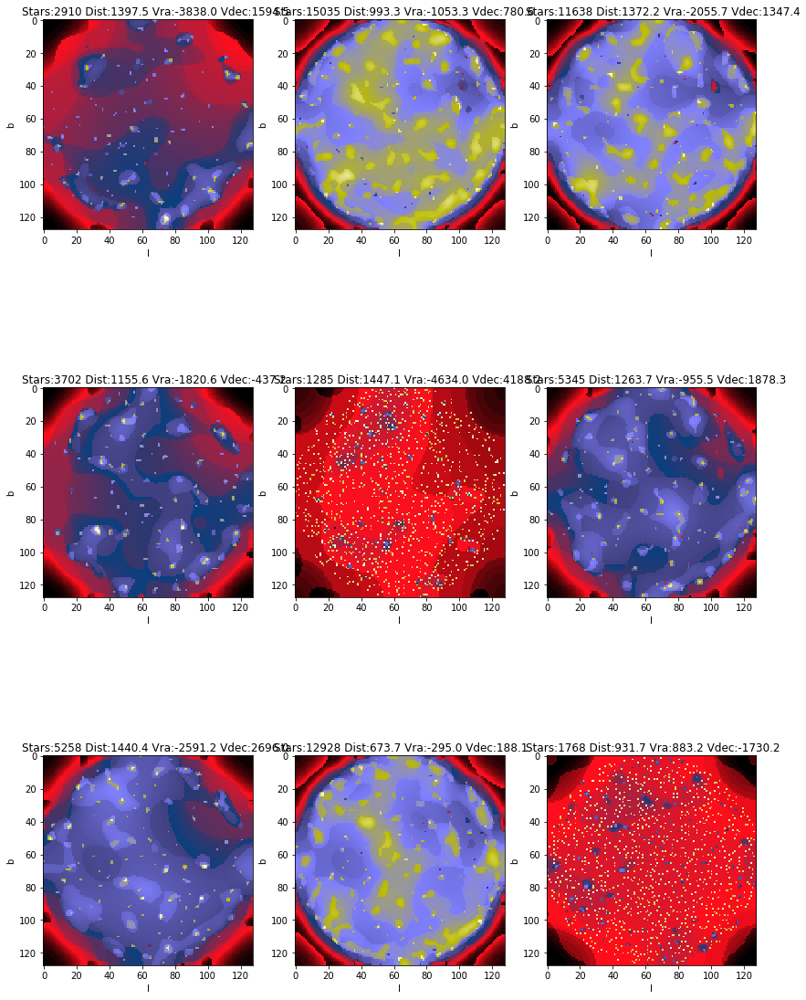

Cluster: Alessi 3
Distance: 311.0 pc


## Total stars: 80806
## Stars selected: 30196
## computing k-means...
## Centroids:
[[  257.7610029    -15.27124781   832.19719521  -171.74914055
    482.52684188]
 [  257.76951422   -15.25514787  1177.43532813 -1548.23731671
    809.948128  ]
 [  257.77524179   -15.24548651  1435.94582642 -2048.17710506
   5128.14778836]
 [  257.7783819    -15.25743587  1312.47287816 -1649.04119864
   2766.47440623]
 [  257.76399827   -15.27236061  1077.654416    1768.06730319
  -3099.57248517]
 [  257.7729349    -15.26233738   995.07571593  -176.40315295
  -1140.0341022 ]
 [  257.76211624   -15.2734074   1224.5089576   -305.04209435
   1738.34303907]
 [  257.77269915   -15.29597311  1353.12421675   241.63957516
   3648.13440387]
 [  257.7718495    -15.26898273  1199.92795426  1583.49975556
    607.54525177]]
## Label: 0, 7917 stars
## Label: 1, 3274 stars
## Label: 2, 1295 stars
## Label: 3, 3472 stars
## Label: 4, 693 stars
## Label: 5, 2835 stars
## Label: 6, 6941 stars
## Label: 7, 2037 stars
## 

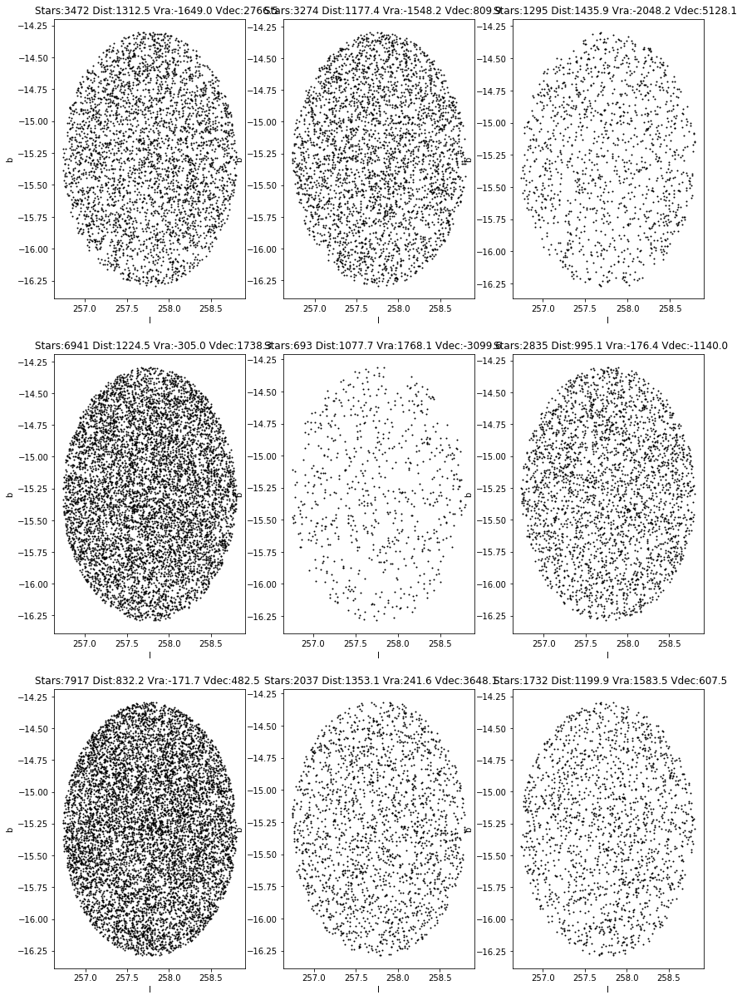

23525
## std: 0.491878
23250
## std: 0.403474
20800
## std: 0.292816
23300
## std: 0.412876
16600
## std: 0.249269
23025
## std: 0.386539
23500
## std: 0.486398
22750
## std: 0.341006
22175
## std: 0.325488


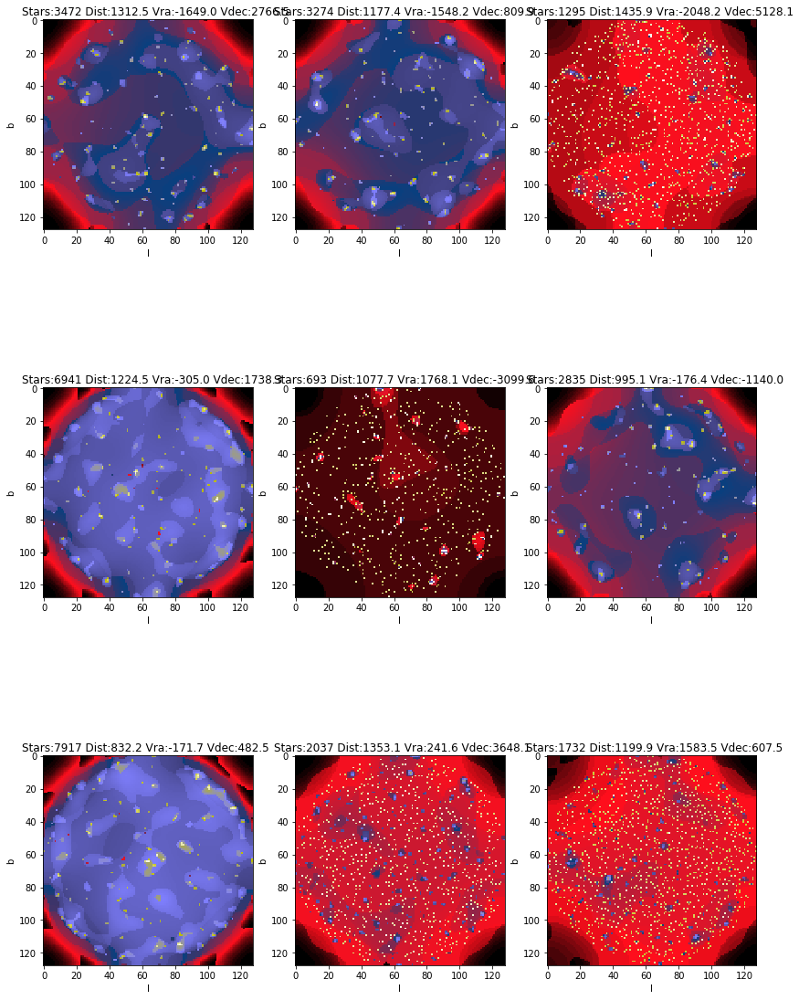

Cluster: FSR 1613
Distance: 1965.0 pc


## Total stars: 122237
## Stars selected: 44437
## computing k-means...
## Centroids:
[[  299.50872652    16.36020779  1225.80402001 -1444.33576275
  -2130.97837813]
 [  299.47594661    16.35570269  1390.27560772 -4458.34789554
    633.74036301]
 [  299.50815963    16.3369383   1286.13147972 -3023.00815142
   -496.02383982]
 [  299.47977373    16.35611175  1275.70254254 -2433.97165107
   1170.94977004]
 [  299.5055038     16.32730401  1476.42974845 -6981.48819279
    757.57946824]
 [  299.48136715    16.37618006  1023.10470653  1331.52271613
  -1169.93540771]
 [  299.48415114    16.32507641   713.14147401  -409.44363672
     52.39067223]
 [  299.49011608    16.35894776  1405.04616778 -5071.0208189
  -2050.86302378]
 [  299.49103092    16.34047531  1008.17786363 -1602.49591031
    -87.04614349]]
## Label: 0, 2575 stars
## Label: 1, 3996 stars
## Label: 2, 7125 stars
## Label: 3, 4412 stars
## Label: 4, 1370 stars
## Label: 5, 2021 stars
## Label: 6, 10389 stars
## Label: 7, 1827 stars
#

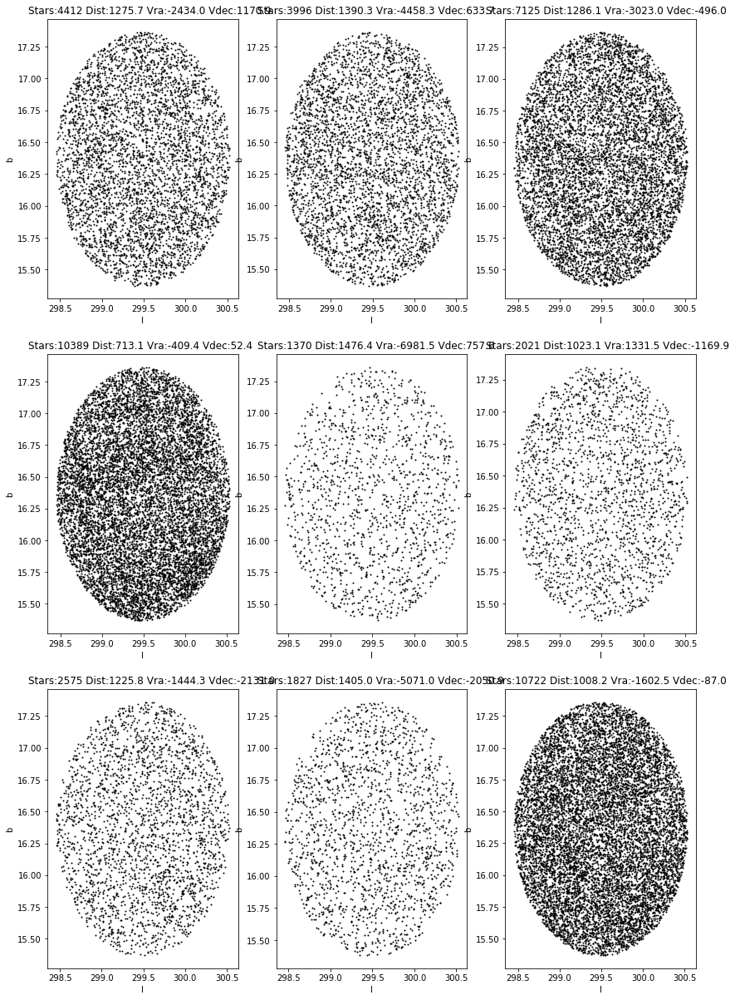

23025
## std: 0.375471
23725
## std: 0.430396
23700
## std: 0.488536
23700
## std: 0.444613
21125
## std: 0.303471
22475
## std: 0.343232
23775
## std: 0.499982
22250
## std: 0.328295
23900
## std: 0.499728


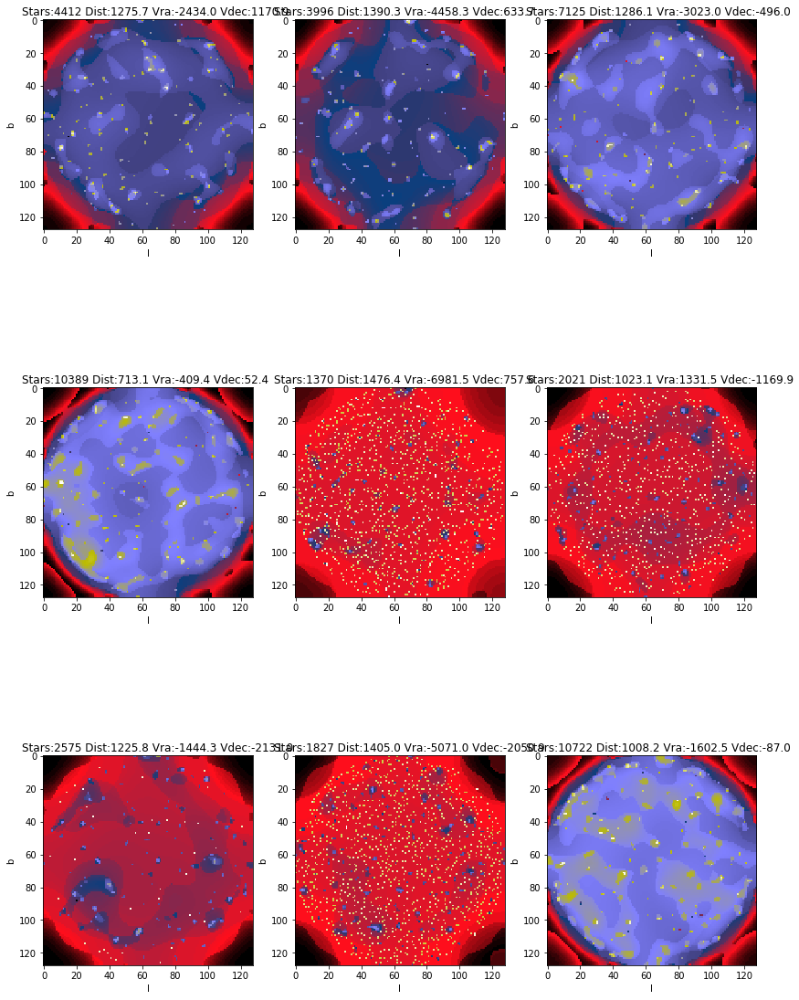

Cluster: MWSC 4498
Distance: 1537.0 pc


## Total stars: 83943
## Stars selected: 31722
## computing k-means...
## Centroids:
[[  352.07050262   -26.02646597  1247.09256349 -2348.88789495
   -698.10787608]
 [  352.07395209   -26.04016903  1169.85317956  1034.86046614
  -2757.40579404]
 [  352.07729598   -26.05455055  1387.54183779   406.41437794
  -5874.7175579 ]
 [  352.04844463   -26.02652369   824.91558025  -117.67366467
    190.17604498]
 [  352.0723377    -26.03883978  1278.91006188 -1047.66446765
  -2944.05540945]
 [  352.05122898   -26.05464273  1371.29336597  3518.8460687
  -4112.31235015]
 [  352.05096651   -26.05211055  1408.78333645 -3952.5477891
  -4768.64297214]
 [  352.05324975   -26.02698553   930.08342341  -151.77460756
  -1232.51081358]
 [  352.08183      -26.04598791  1110.93791114  1777.27780317
   -821.97302221]]
## Label: 0, 2511 stars
## Label: 1, 4349 stars
## Label: 2, 1310 stars
## Label: 3, 5857 stars
## Label: 4, 3515 stars
## Label: 5, 1294 stars
## Label: 6, 704 stars
## Label: 7, 8347 stars
## La

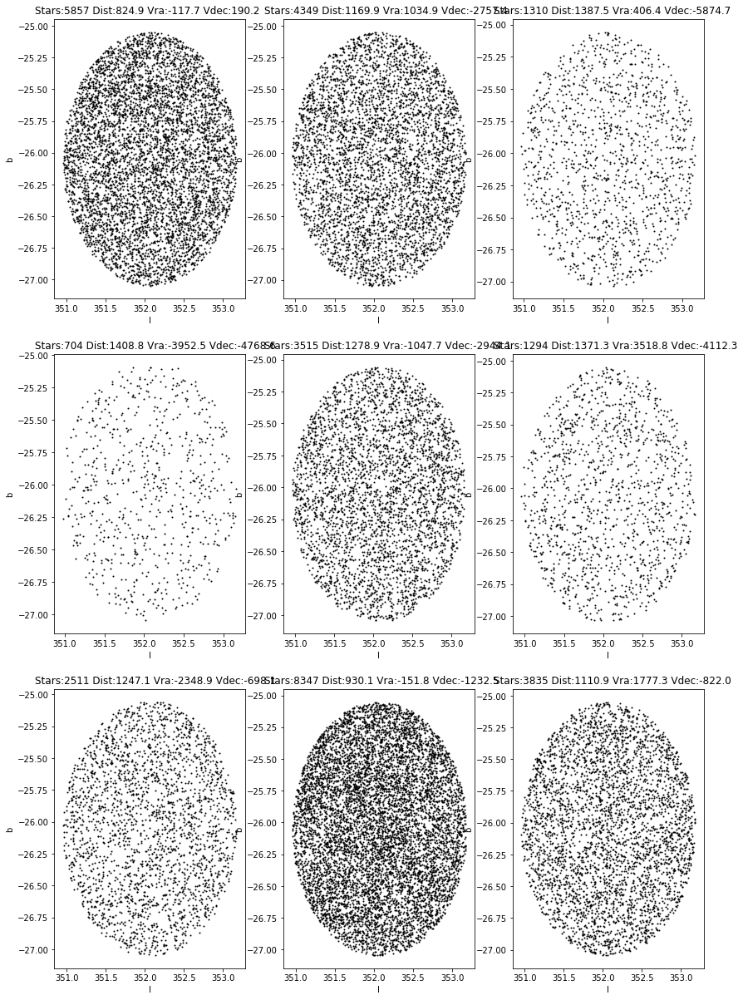

22575
## std: 0.375370
23750
## std: 0.436139
20750
## std: 0.297803
23675
## std: 0.472911
23600
## std: 0.414761
20925
## std: 0.297143
17825
## std: 0.251254
23600
## std: 0.495498
23600
## std: 0.420697


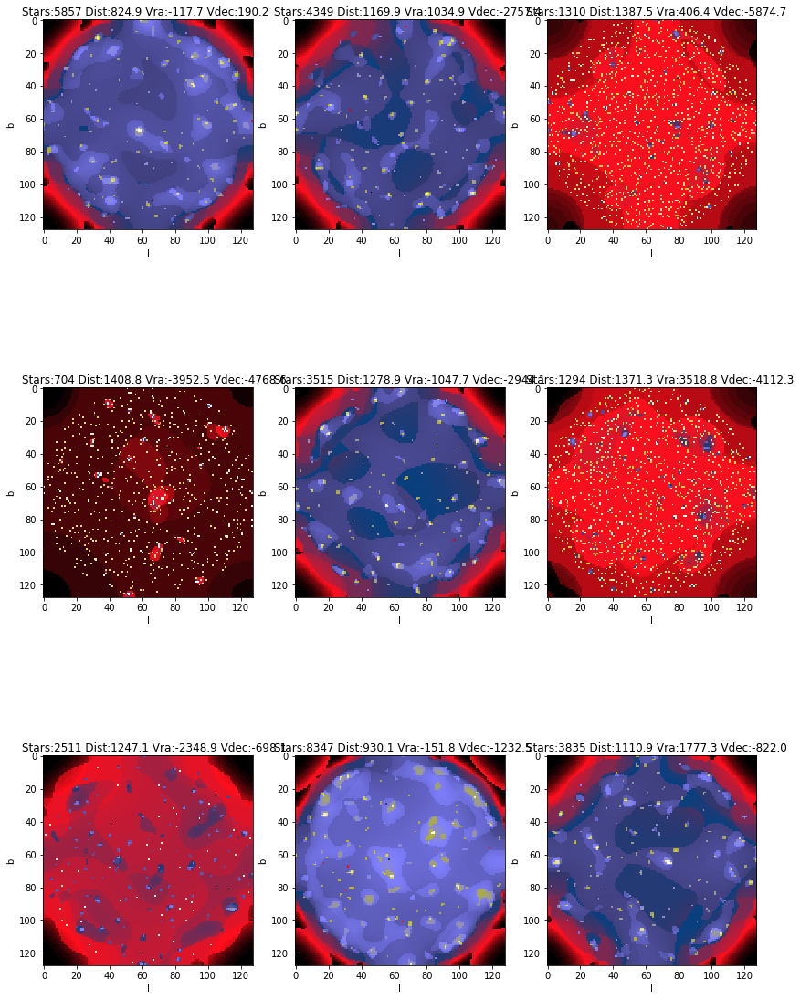

Cluster: MWSC 5705
Distance: 1861.0 pc


## Total stars: 128523
## Stars selected: 44268
## computing k-means...
## Centroids:
[[  350.99895018   -21.78929819  1245.77102187 -2034.19448461
   -507.29827912]
 [  351.00993299   -21.77920876  1180.26736832  1743.02401219
   -793.139117  ]
 [  351.01814684   -21.80770441  1393.41806969  -209.99813817
  -5351.8518074 ]
 [  351.02225875   -21.77354862   887.86369628    14.20206498
    299.1642036 ]
 [  351.01074178   -21.76288012   921.1481692   -152.45321157
  -1063.00871725]
 [  350.99218608   -21.7887808   1468.10646033 -4202.19151145
  -4337.54548097]
 [  350.99562603   -21.76722838  1309.69843578 -1183.71616211
  -2573.97615494]
 [  350.99632606   -21.7859228   1220.63553604   678.94563432
  -2578.39915535]
 [  351.00773112   -21.79019797  1389.8244754   2773.01535112
  -4064.05939247]]
## Label: 0, 3437 stars
## Label: 1, 4817 stars
## Label: 2, 2058 stars
## Label: 3, 7347 stars
## Label: 4, 12290 stars
## Label: 5, 904 stars
## Label: 6, 5319 stars
## Label: 7, 6340 stars
#

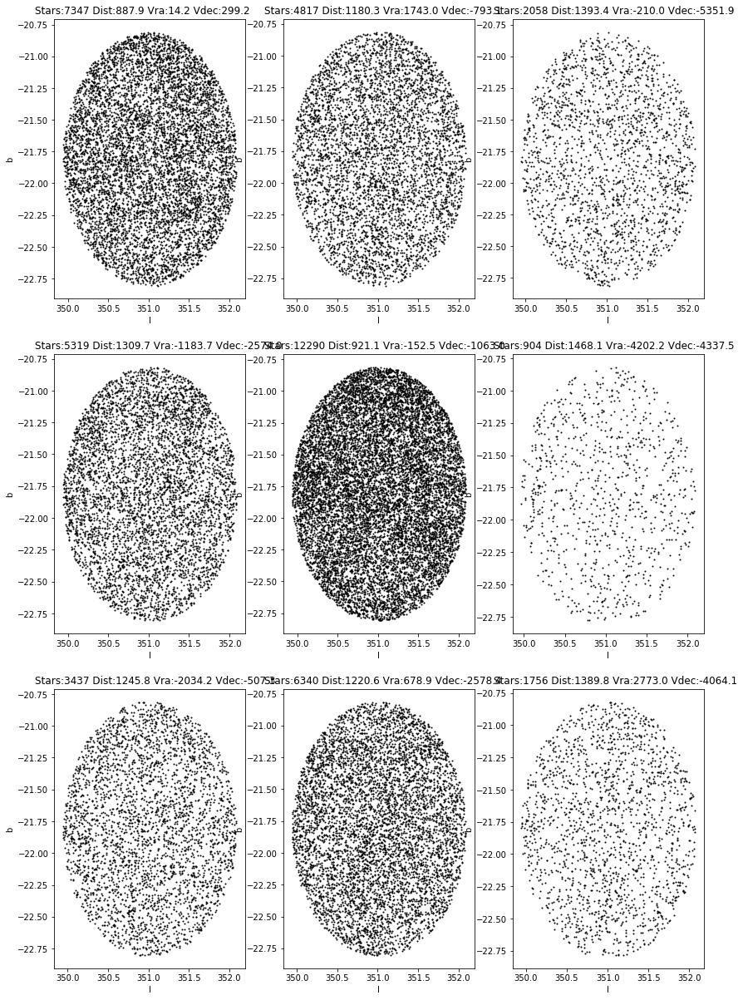

23600
## std: 0.411350
23875
## std: 0.451825
22425
## std: 0.351713
23600
## std: 0.489976
23750
## std: 0.495761
18650
## std: 0.265991
23375
## std: 0.461086
23450
## std: 0.481235
22250
## std: 0.323643


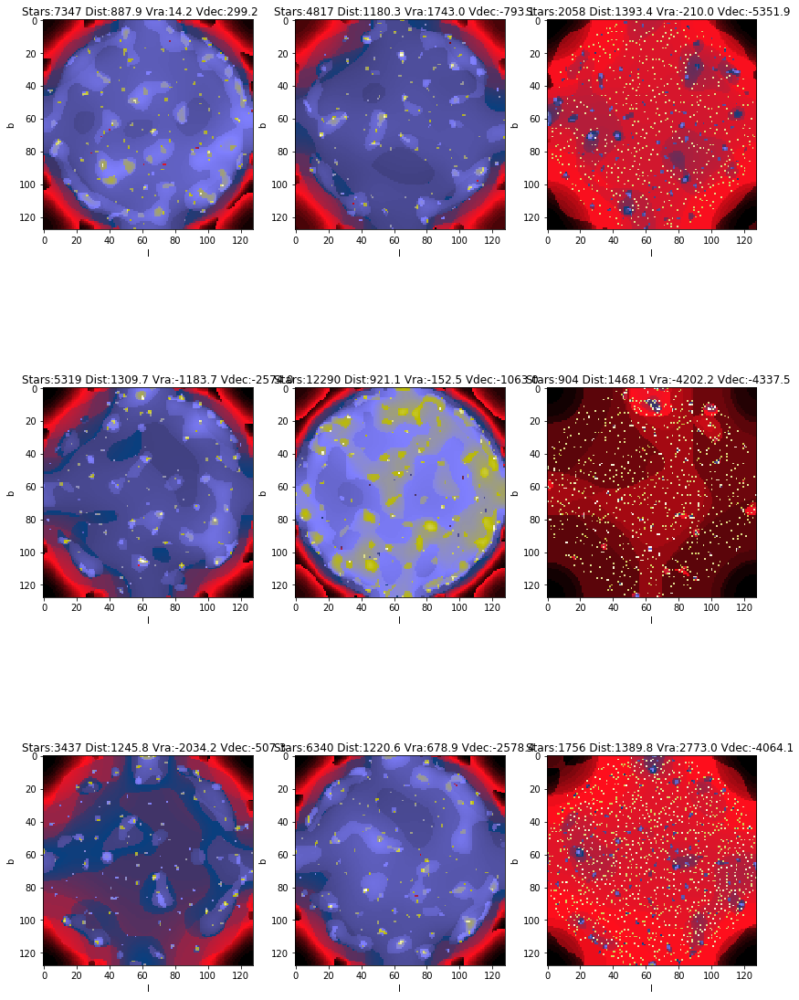

Cluster: ESO 260-17
Distance: 1808.0 pc


## Total stars: 159526
## Stars selected: 61609
## computing k-means...
## Centroids:
[[ 2.67462013e+02  8.42549425e-01  7.02056838e+02 -2.07302187e+02
   2.08136237e+02]
 [ 2.67474620e+02  8.25681944e-01  1.36923120e+03 -1.89402286e+03
   1.33752295e+03]
 [ 2.67462505e+02  8.06358933e-01  1.48810391e+03 -4.20514867e+03
   4.24923292e+03]
 [ 2.67465485e+02  8.32460731e-01  9.82538412e+02 -9.68072016e+02
   8.33155071e+02]
 [ 2.67439073e+02  8.52973527e-01  1.39726167e+03 -3.76864633e+03
   1.52655043e+03]
 [ 2.67430705e+02  7.80525285e-01  9.21516993e+02  1.07276868e+03
  -1.84278655e+03]
 [ 2.67449387e+02  8.15220076e-01  1.49537582e+03 -2.45776295e+03
   2.59177181e+03]
 [ 2.67454396e+02  8.32323579e-01  1.13491157e+03 -1.58995866e+03
  -5.35382014e+02]
 [ 2.67439710e+02  8.13645308e-01  1.31023759e+03 -8.71524033e+02
   2.03989916e+03]]
## Label: 0, 11646 stars
## Label: 1, 12706 stars
## Label: 2, 1709 stars
## Label: 3, 15340 stars
## Label: 4, 2548 stars
## Label: 5, 1632 stars
#

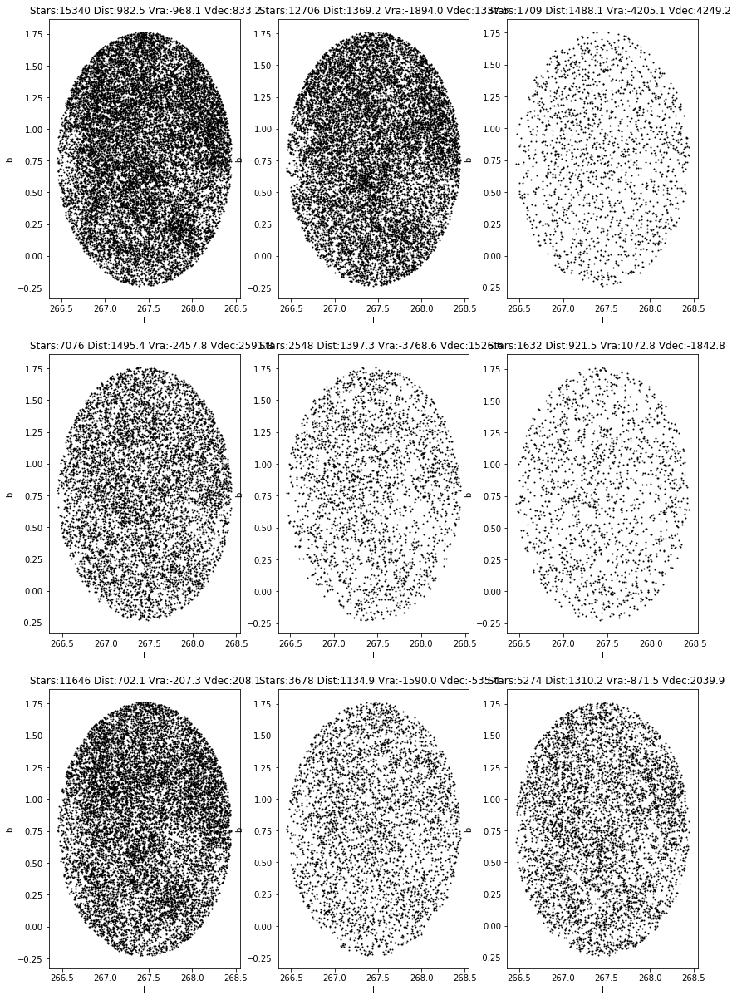

23600
## std: 0.498363
23825
## std: 0.495736
22050
## std: 0.331220
23600
## std: 0.483043
23100
## std: 0.377260
22025
## std: 0.316991
23400
## std: 0.485607
23450
## std: 0.425883
23725
## std: 0.462255


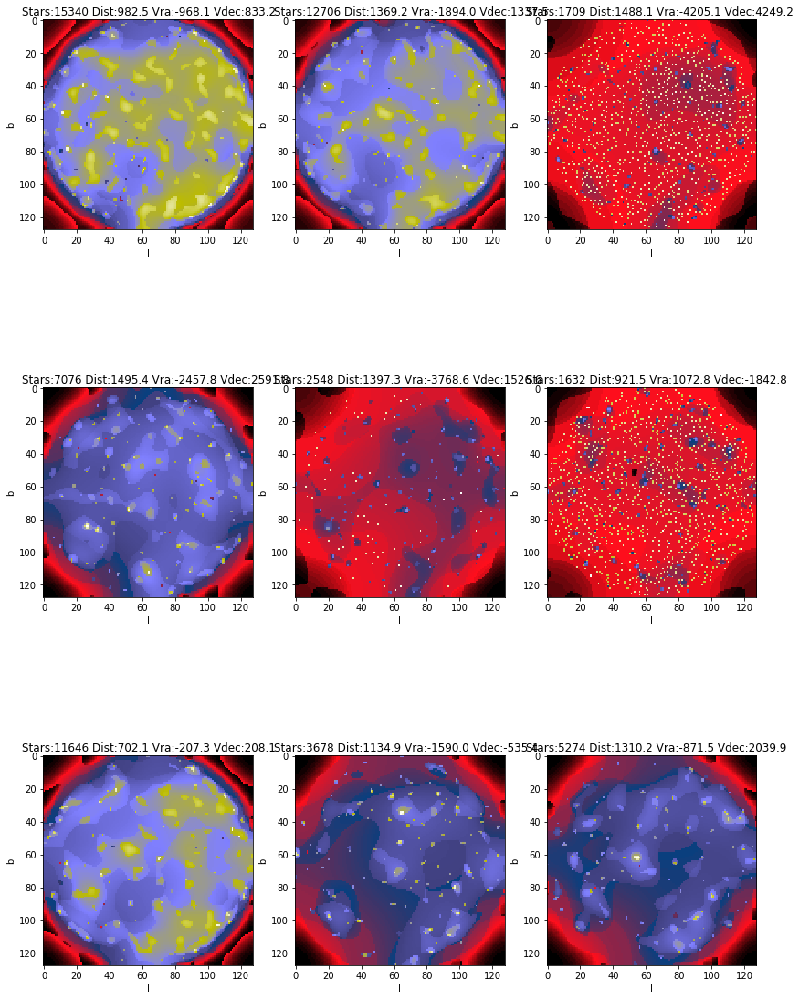

Cluster: ESO 245-09
Distance: 1380.0 pc


## Total stars: 9536
## Stars selected: 5022
## computing k-means...
## Centroids:
[[  273.51756521   -67.49995459   948.29348416  3853.35142848
   2461.26651072]
 [  273.37674404   -67.53101214   714.3140793    171.02495569
   -304.35800713]
 [  273.42136073   -67.52701113   966.09046481  3786.14350708
   -421.39841676]
 [  273.43172811   -67.50688725   729.47972718  1636.42277559
    875.19588399]
 [  273.37924658   -67.51592355  1165.46899485   290.48943568
  -6045.26243639]
 [  273.60141262   -67.55849038  1186.53354314  7012.16175251
    796.6849226 ]
 [  273.35953755   -67.60207134  1220.16866471  5485.06781818
  -4342.88127233]
 [  273.44839332   -67.54611612   980.65238156  1801.05880922
  -1977.21274126]
 [  273.54145362   -67.57634678   772.37064604 -1204.34725283
  -2331.68917839]]
## Label: 0, 359 stars
## Label: 1, 1241 stars
## Label: 2, 659 stars
## Label: 3, 961 stars
## Label: 4, 164 stars
## Label: 5, 220 stars
## Label: 6, 175 stars
## Label: 7, 757 stars
## Label: 8

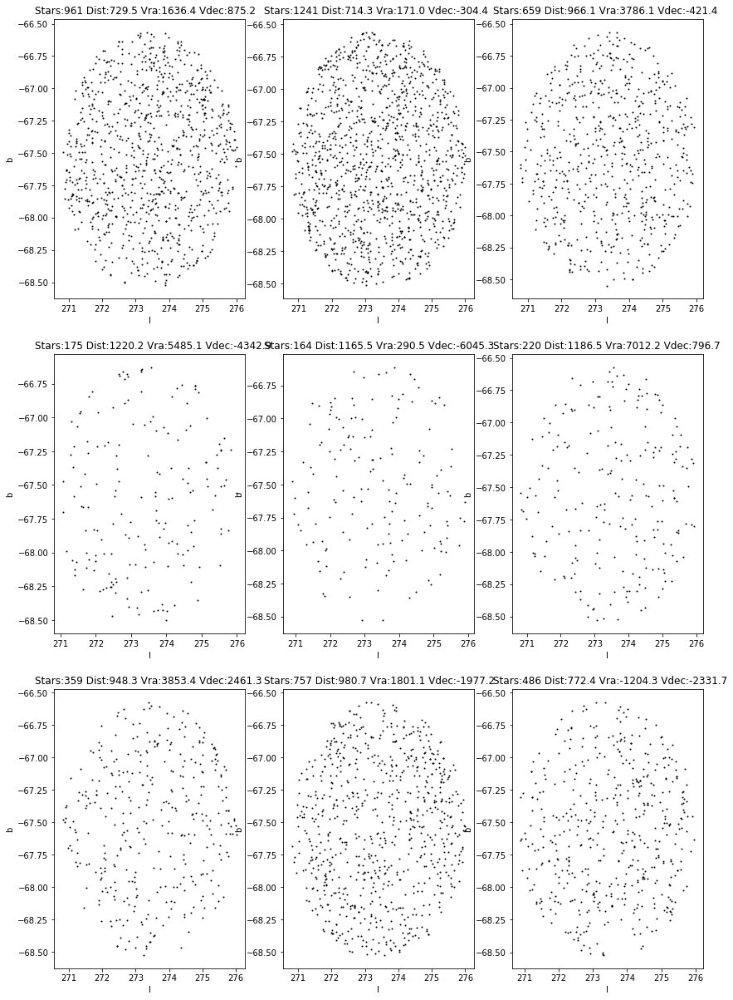

10900
## std: 0.224819
20525
## std: 0.286652
16075
## std: 0.251628
19350
## std: 0.268797
6750
## std: 0.207060
7600
## std: 0.214100
6050
## std: 0.213976
16725
## std: 0.259160
13175
## std: 0.231265


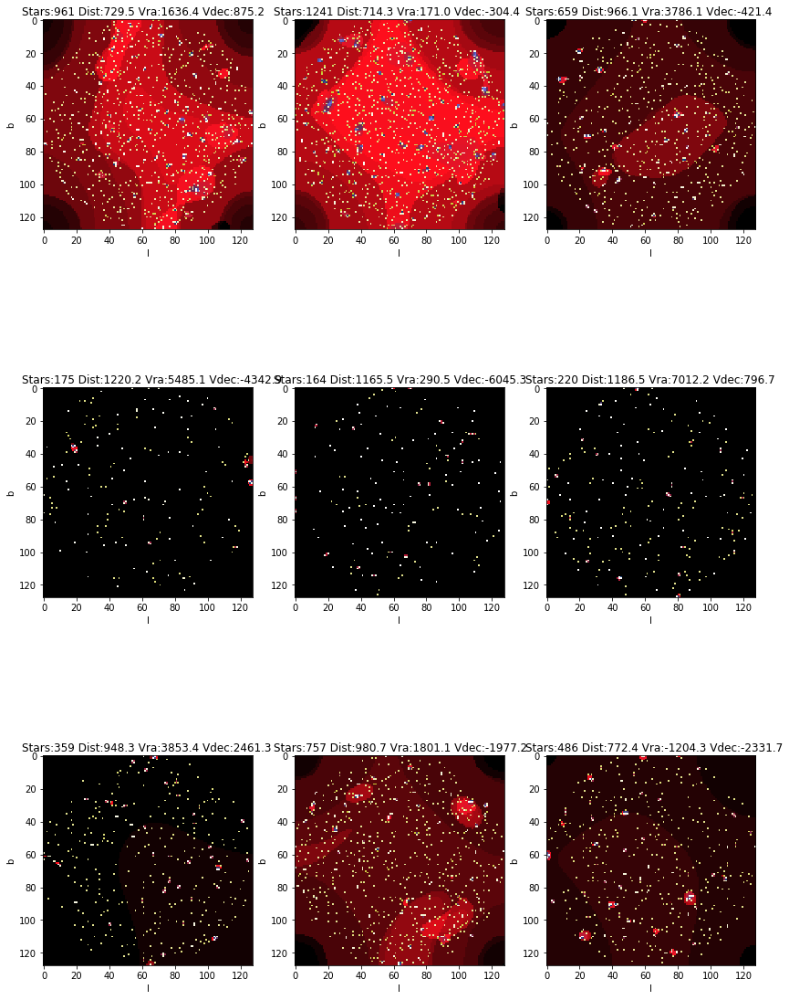

Cluster: FSR 1574
Distance: 1389.0 pc


## Total stars: 107340
## Stars selected: 38987
## computing k-means...
## Centroids:
[[ 2.90963385e+02  1.57342379e+01  1.27374054e+03 -3.06343868e+03
  -3.79525977e+01]
 [ 2.90948717e+02  1.57346042e+01  7.62664365e+02 -2.22029285e+02
   2.45096490e+01]
 [ 2.90952905e+02  1.57214400e+01  9.98771151e+02 -1.49300025e+03
   3.73081604e+00]
 [ 2.90947567e+02  1.57420596e+01  1.37608592e+03 -4.17323902e+03
   1.44679417e+03]
 [ 2.90950701e+02  1.57532763e+01  1.46811166e+03 -6.65463761e+03
   2.02727630e+03]
 [ 2.90948832e+02  1.57495896e+01  1.04746316e+03  1.42116461e+03
  -1.70016709e+03]
 [ 2.90968438e+02  1.57501870e+01  1.38862431e+03 -5.40138054e+03
  -8.77664707e+02]
 [ 2.90943525e+02  1.57395484e+01  1.22646530e+03 -2.06457260e+03
   1.33754737e+03]
 [ 2.90941042e+02  1.57940705e+01  1.23248573e+03 -1.89705682e+03
  -2.09658934e+03]]
## Label: 0, 6488 stars
## Label: 1, 8117 stars
## Label: 2, 9295 stars
## Label: 3, 3613 stars
## Label: 4, 1336 stars
## Label: 5, 1589 stars
## L

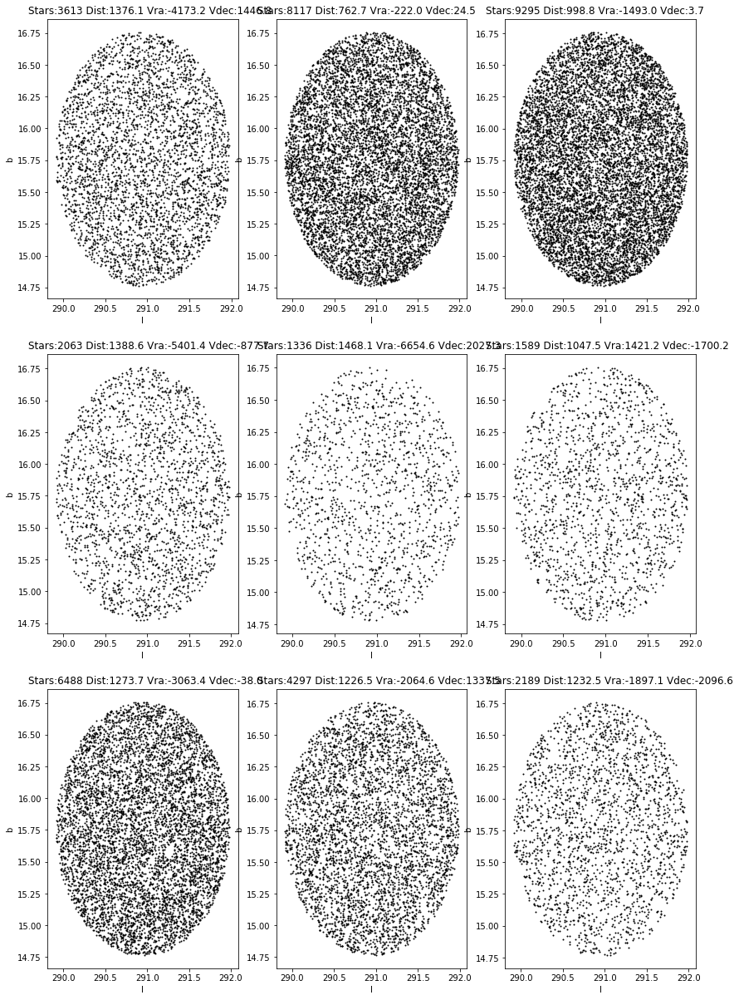

23800
## std: 0.480281
23500
## std: 0.493818
23900
## std: 0.498892
23575
## std: 0.417096
20750
## std: 0.296629
21975
## std: 0.315859
22775
## std: 0.350439
23100
## std: 0.436963
22775
## std: 0.356500


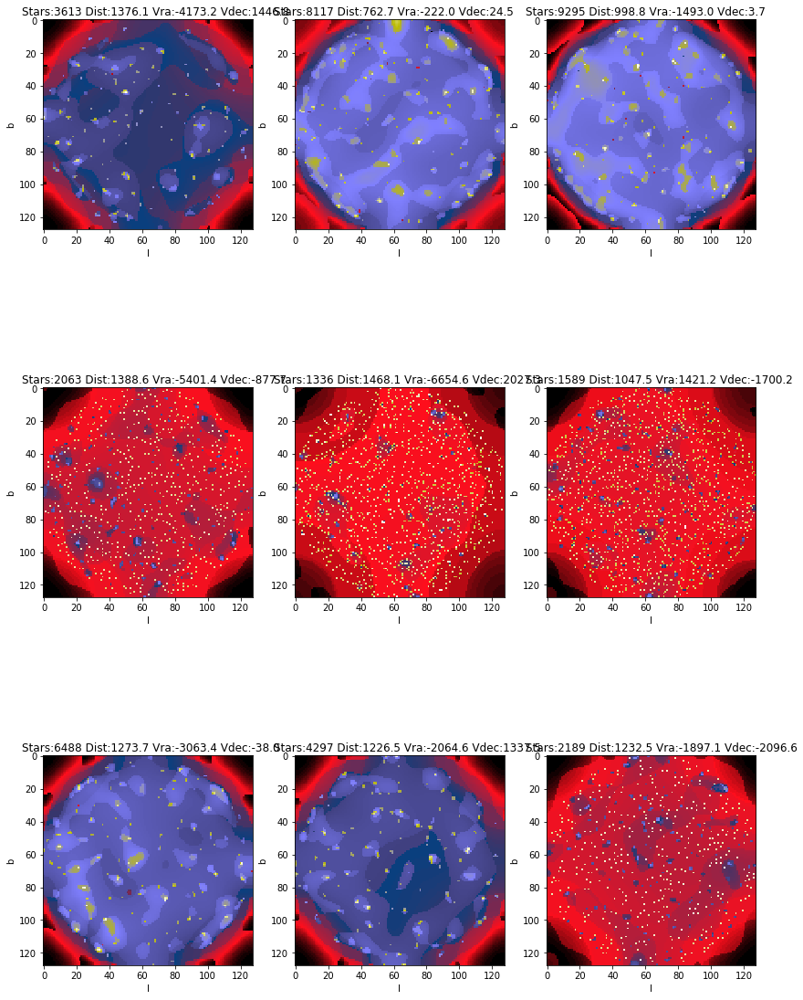

Cluster: vdBergh-Hagen 200
Distance: 1633.0 pc


FileNotFoundError: [Errno 2] No such file or directory: 'vdBergh-Hagen 200-1.0deg.vot'

In [8]:
###############################################################
######  Main loop
###############################################################

df_cluster = read_cluster_list(filelist)
print(df_cluster.index)
print(df_cluster.columns)

lastSC , lastrow = find_lastSC(fileoutGaia, filelist, df_cluster)

print(lastSC)

for index, row in df_cluster.iloc[lastrow:].iterrows():
    clustername = row['name'].strip()
    print("Cluster: %s"%(clustername))
    print("Distance: %3.1f pc"%(row['distance']))
    
    rasplit = row['ra'].split(' ')
    decsplit = row['dec'].split(' ')
    racluster = "%sh%sm%ss"%(rasplit[0],rasplit[1],rasplit[2])
    deccluster = "%sd%sm"%(decsplit[0],decsplit[1])
    c = coord.SkyCoord(racluster, deccluster, frame='icrs')
    
    if not votable_disk:
        data = get_data(c.ra.deg, c.dec.deg,radius= RADIUS)
    else:
        voname = "%s-%3.1fdeg.vot"%(clustername,RADIUS)
        votable = parse(voname, chunk_size= 32)
        for table in votable.iter_tables():
            data = table.array
                
    
    lgal = data['l']
    bgal = data['b']
    pmas = data['parallax']
    distance = 1000. / np.ma.filled(pmas, -9999.)
    pmra = np.ma.filled(data['pmra'], -9999999999.)
    pmdec= np.ma.filled(data['pmdec'],-99999999.)
    vdec = WEIGHTVEL *4.74  * pmdec / pmas   ##?
    vra  = WEIGHTVEL *4.74 *  pmra  / pmas


    print("## Total stars: %d"%(len(lgal)))

    # datask = np.zeros((len(vra),5))
    datask = filter_data(lgal,bgal,distance,vra,vdec ,cartesian = False)
    print("## Stars selected: %d"%(len(datask[:,0])))


    ## fitted cluster in k-means
    nclust = kCluster

    print("## computing k-means...")
    kmeans = KMeans(n_clusters=nclust, max_iter = 500, n_init = 50)
    kmeans.fit(datask)

    centroid = kmeans.cluster_centers_
    labels = kmeans.labels_

    print("## Centroids:")
    print(centroid)
    # print(labels)
    for i in range(nclust):
        nstar = len(np.where(labels == i)[0])
        print("## Label: %d, %d stars"%(i,nstar))

    ## plot the different clusters

    a1 = datask[:,0]     ## l
    a2 = datask[:,1]     ## b
    plot2d_labels(a1,a2,labels,nclust,centroid,xylab = ["l","b"],title = "Title", clustername= "%s-%3.0fpc"%(clustername,row['distance']))
    plot2d_filtered_labels(a1,a2,labels,nclust,centroid,xylab = ["l","b"],title = "Title", clustername= "%s-%3.0fpc"%(clustername,row['distance']))

    write_SCgaia(fileoutGaia,row)
    